# Aprendizaje Automático - Trabajo Práctico
## Profesores
* Joel Spak
* Augstín Almada
* Bruno Cocitto López
## Alumnos
* Ezequiel Arévalo
* Simón Revello

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sbn
import os
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

from config import CSV_DATA_SOURCE, LOG_LEVEL
from libs.datasets.BaseDataset import BaseDataset

In [2]:
base_dataset = BaseDataset()
base_dataset.load_csv(CSV_DATA_SOURCE)

,Unnamed: 0,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,...,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,RainfallTomorrow
0,0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,...,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No,0.0
1,1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,...,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No,0.0
2,2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,...,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No,0.0
3,3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,...,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No,1.0
4,4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,...,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No,0.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145407,145454,2017-06-20,Uluru,3.5,21.8,0.0,NaN,NaN,E,31.0,...,27.0,1024.7,1021.2,NaN,NaN,9.4,20.9,No,No,0.0
145408,145455,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,...,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No,0.0
145409,145456,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,...,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No,0.0
145410,145457,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,...,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No,0.0


# Análisis Descriptivo

## Entendiendo el Dataset y los tipos de datos

In [3]:
print(base_dataset.df.info())
print("-----------------------------------")
print(base_dataset.df.describe())
print("-----------------------------------")
print(base_dataset.df.head())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145412 entries, 0 to 145411
Data columns (total 25 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Unnamed: 0        145412 non-null  int64  
 1   Date              145412 non-null  object 
 2   Location          145412 non-null  object 
 3   MinTemp           143928 non-null  float64
 4   MaxTemp           144159 non-null  float64
 5   Rainfall          142152 non-null  float64
 6   Evaporation       82658 non-null   float64
 7   Sunshine          75616 non-null   float64
 8   WindGustDir       135096 non-null  object 
 9   WindGustSpeed     135159 non-null  float64
 10  WindDir9am        134850 non-null  object 
 11  WindDir3pm        141186 non-null  object 
 12  WindSpeed9am      143645 non-null  float64
 13  WindSpeed3pm      142351 non-null  float64
 14  Humidity9am       142759 non-null  float64
 15  Humidity3pm       140907 non-null  float64
 16  Pressure9am       13

Nos quedamos con las localidades que corresponden para el trabajo práctico e imprimimos los campos del dataset para entenderlo mejor.

In [4]:
base_dataset.df.query("Location in ('Sydney', 'SydneyAirport', 'Canberra', 'Melbourne', 'MelbourneAirport')", inplace=True)
base_dataset.df.drop("Unnamed: 0", axis=1, inplace=True)

## Valores Nulos
---

<p>Graficamos la dispersion de los valores nulos en un mapa de calor.</p>
<p>Detectamos que casi el 35% de nuestro dataset tiene filas con valores nulos por lo que hacer un dropna() no es una buena opcion.</p>

In [5]:

print( f"Total rows: {base_dataset.df.shape[0]} | Total nulls: {base_dataset.get_amount_of_rows_with_missing_vals()} | {base_dataset.get_percent_of_row_with_missing_vals()}% of null values ")

Total rows: 15986 | Total nulls: 5525 | 34.56149130489178% of null values 


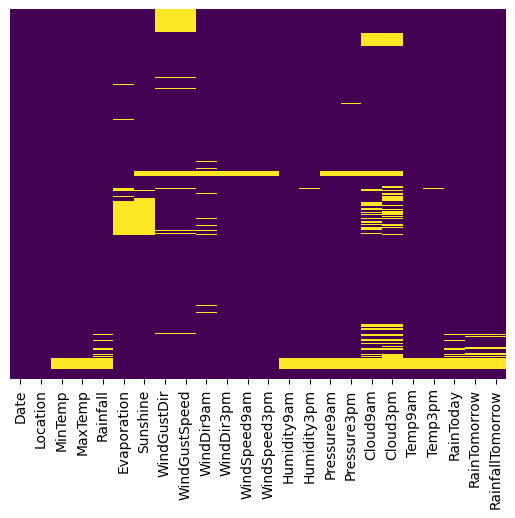

In [6]:
base_dataset.plot_nulls()

## Tratamiento de los valores nulos
---

<p> Guardmos las filas donde las variables dependientes tienen valor nulos </p>


In [7]:
null_rows_for_yy = base_dataset.df.loc[ base_dataset.df['RainTomorrow'].isnull() | base_dataset.df['RainfallTomorrow'].isnull() | base_dataset.df['Rainfall'].isnull()  ]
base_dataset.df.drop(null_rows_for_yy.index, inplace=True)

### Graficar y entender la distribucion de las variables
---
Primero, trataremos de entender la distribucion del resto de las variables y cómo se ajustan los distintos métodos de interpolación a los datos para completar los valores nulos.



### Interpolar utilizando method='linear'
---
Considerando que los datos representan valores recolectados cronologicamente del clima para fechas consecutivas, se deberia tener un comportamiento ciclico en el valores de las variables, al menos en las de temperatura.

Se puede deducir que que la interpolacion lineal no generara un muy buen resultado para completar brechas grandes consecutivas de valores nulos debido a que no se ajusta bien a un comportamiento ciclico.

A continuación, se muestran como se reemplazan los valores nulos en el conjunto de datos, demostrando que la interpolación 'linear' no es un metodo efectivo para interporlar valores nulos consecutivos en grandes rangos del indice.

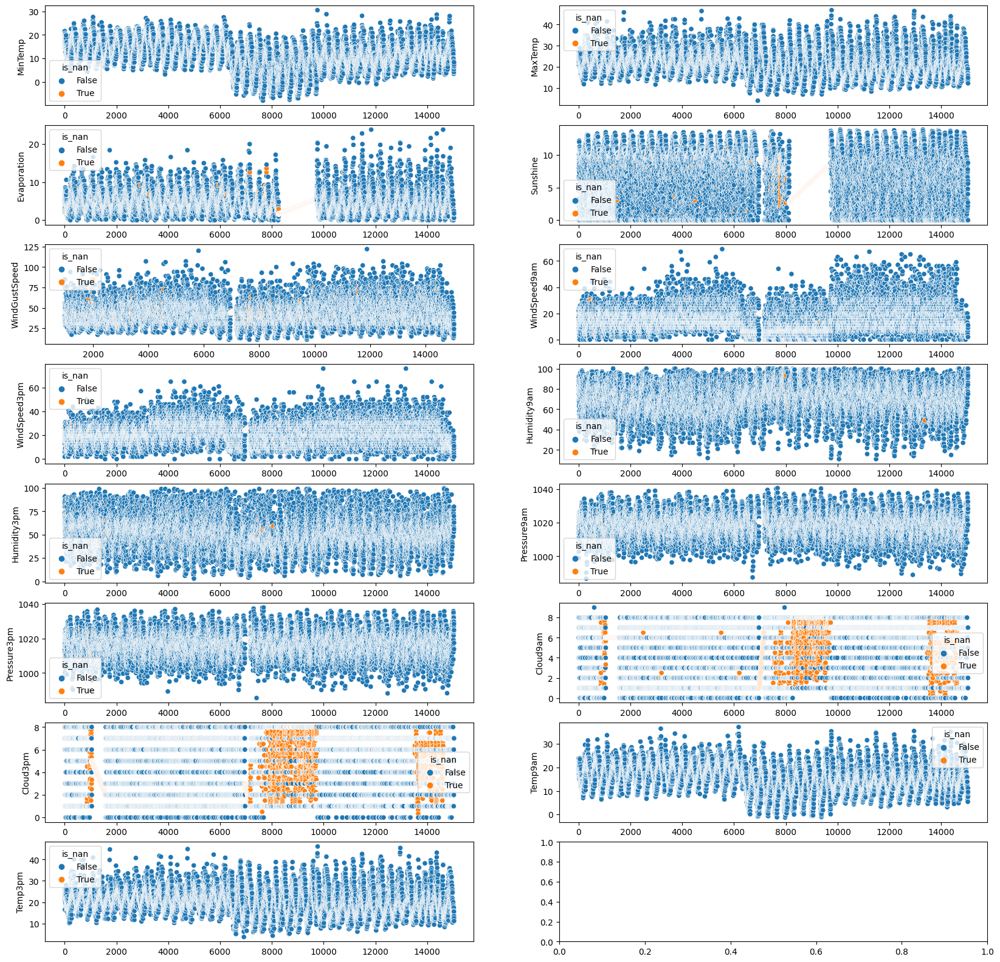

In [8]:
cols = ['MinTemp','MaxTemp','Evaporation', 'Sunshine',
       'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
       'Temp9am', 'Temp3pm' ]

cols_to_interpolate = cols.copy()

base_dataset.plot_interpolated_scatter(cols, fsize=(20,20))

### Interpolacion metodo nearest
---

Vemos que el metodo "nearest" se ajusta bien para la variables cloud9am y cloud3pm, pero no es muy efectivo para completar nulos donde la brecha entre valores consecutivos es muy grande.

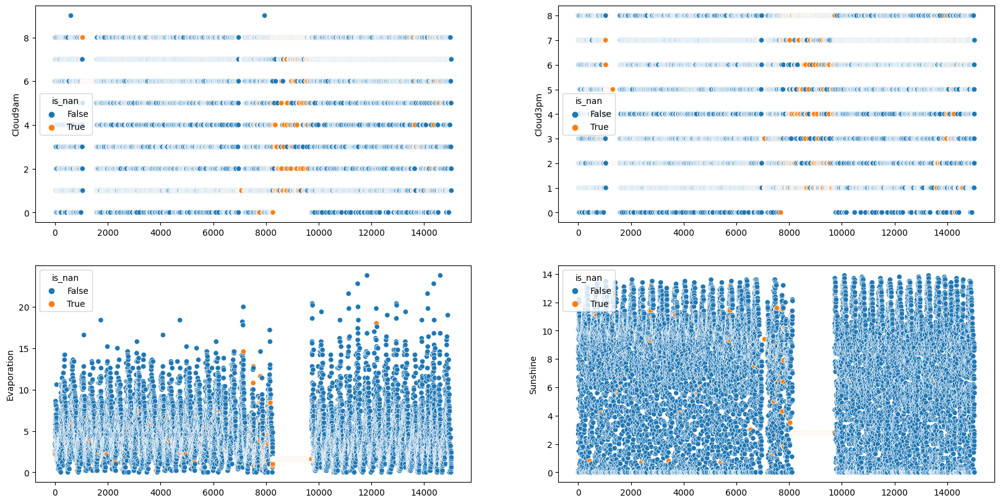

In [9]:

base_dataset.plot_interpolated_scatter(["Cloud9am", "Cloud3pm", "Evaporation","Sunshine"], method="nearest", fsize=(20,10))

### Interpolamos utilizando nearest para Cloud9am y Cloud3pm
---


Cloud9am valores nulos : 0
Cloud3pm valores nulos : 0


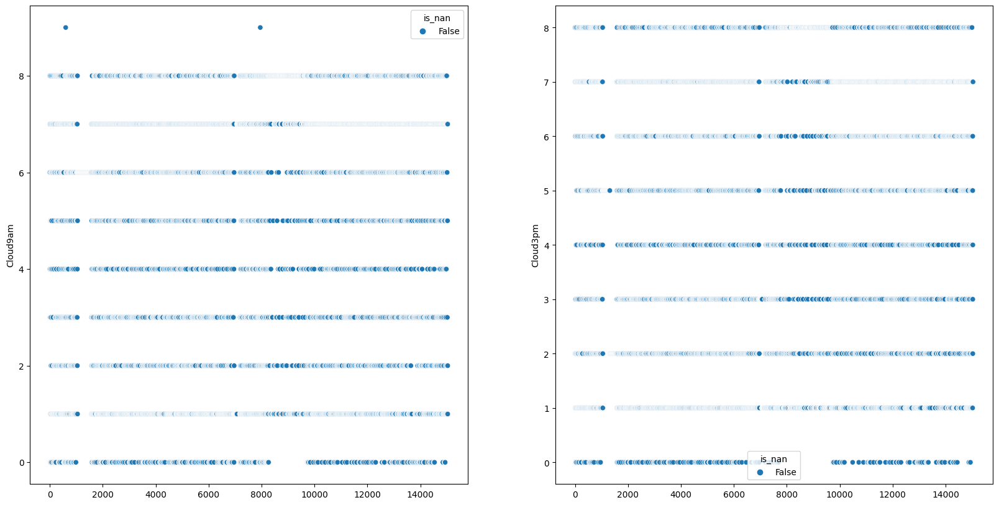

In [10]:
for col in ["Cloud9am", "Cloud3pm"]:
    base_dataset.df[col].interpolate(method="nearest", inplace=True)
    print( f"{col} valores nulos : {base_dataset.df[col].isnull().sum()}")

base_dataset.plot_interpolated_scatter(["Cloud9am", "Cloud3pm"], method="nearest", fsize=(20,10))
cols_to_interpolate = [col for col in cols_to_interpolate if col not in ["Cloud9am", "Cloud3pm"]]

### Interpolacion Polinomica
---


### Interpolar utilizando metodos polinomicos
<p>Intentamos a continuación inteporlar utilizando distintos métodos polinómicos para intentar conseguir un mejor ajuste para la interpolacion, </p>
<p>pero donde existen grandes brechas de valores nulos, al igual que los lineales, los modelos polinómicos no se ajustan bien. </p>
<p> Por lo que interpolacion mediante metodos polinomicos es la peor opción de todas las analizadas hasta ahora, incluso intentando métodos de órden de diferente exponentes.</p>

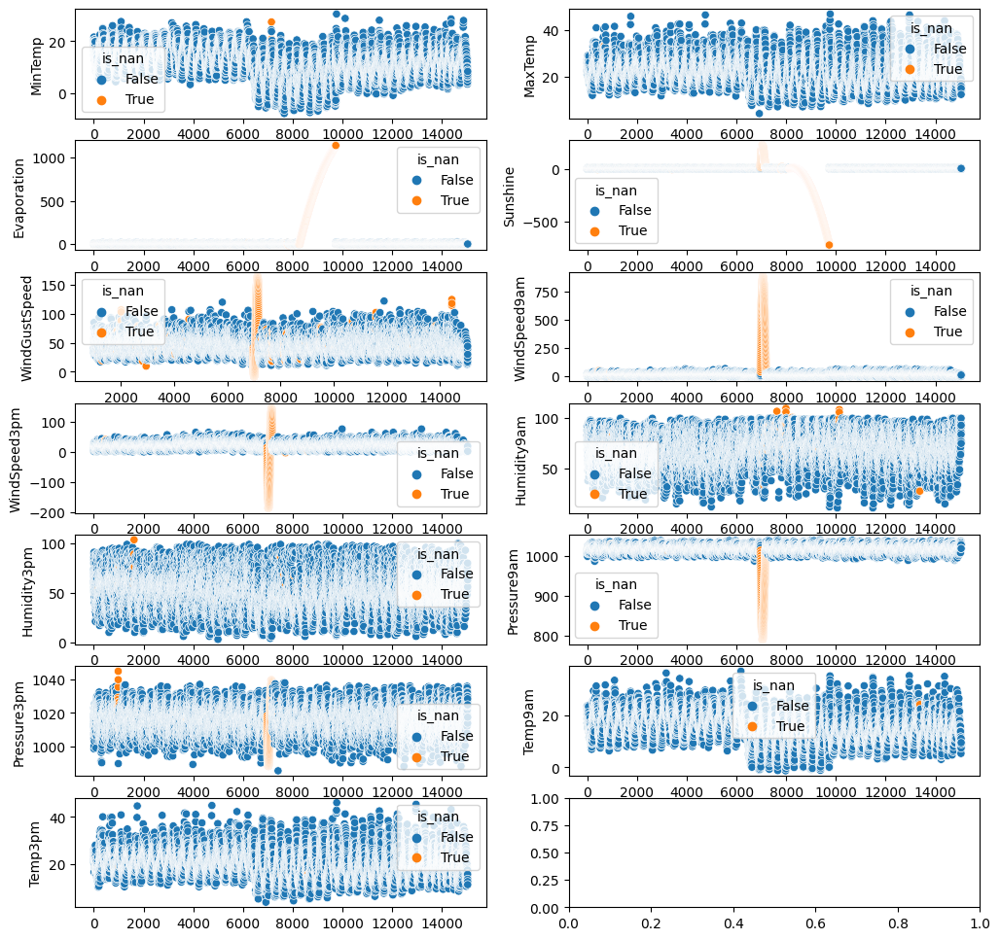

Interpolando con slinear


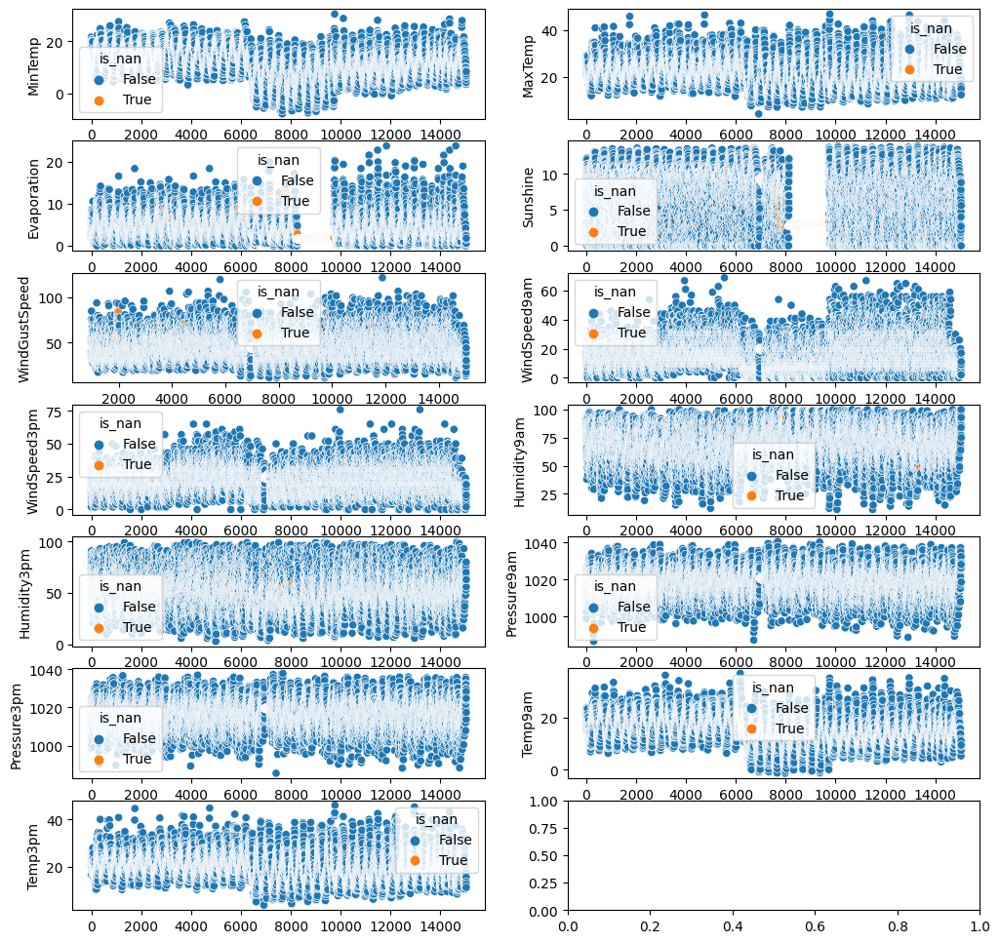

In [11]:
base_dataset.plot_interpolated_scatter(cols_to_interpolate, method="cubicspline")

print("Interpolando con slinear")

base_dataset.plot_interpolated_scatter(cols_to_interpolate, method="slinear")


### Interpolando variables de temperatura, humedad y presion
---
<p> Hacemes zoom sobre las variables que parecen ajustarse bien para una interpolacion lineal </p>

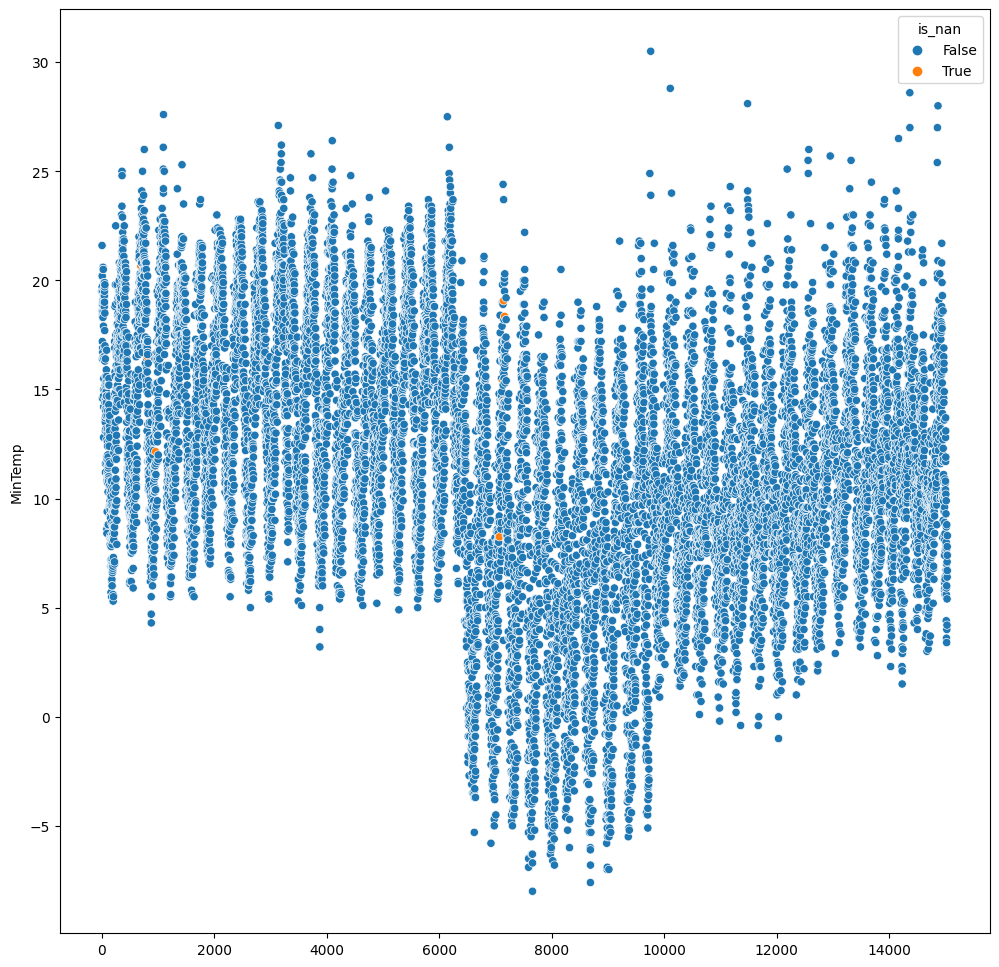

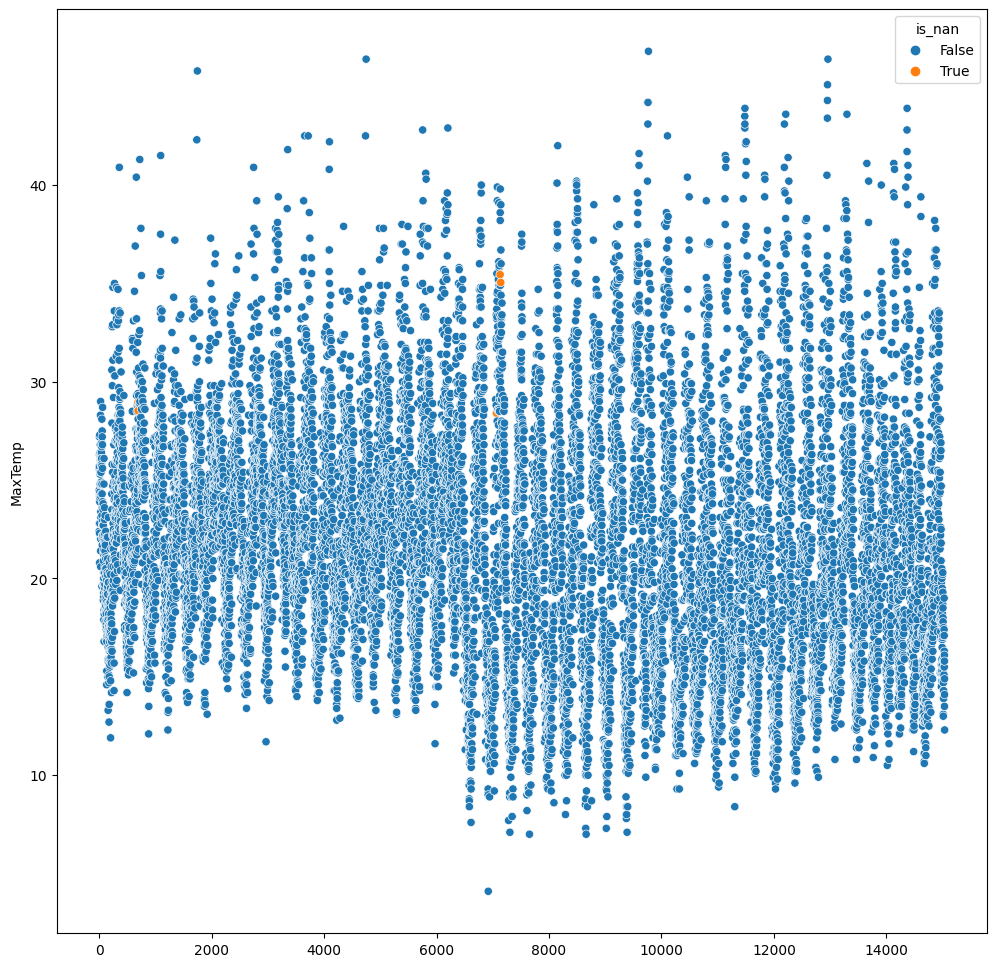

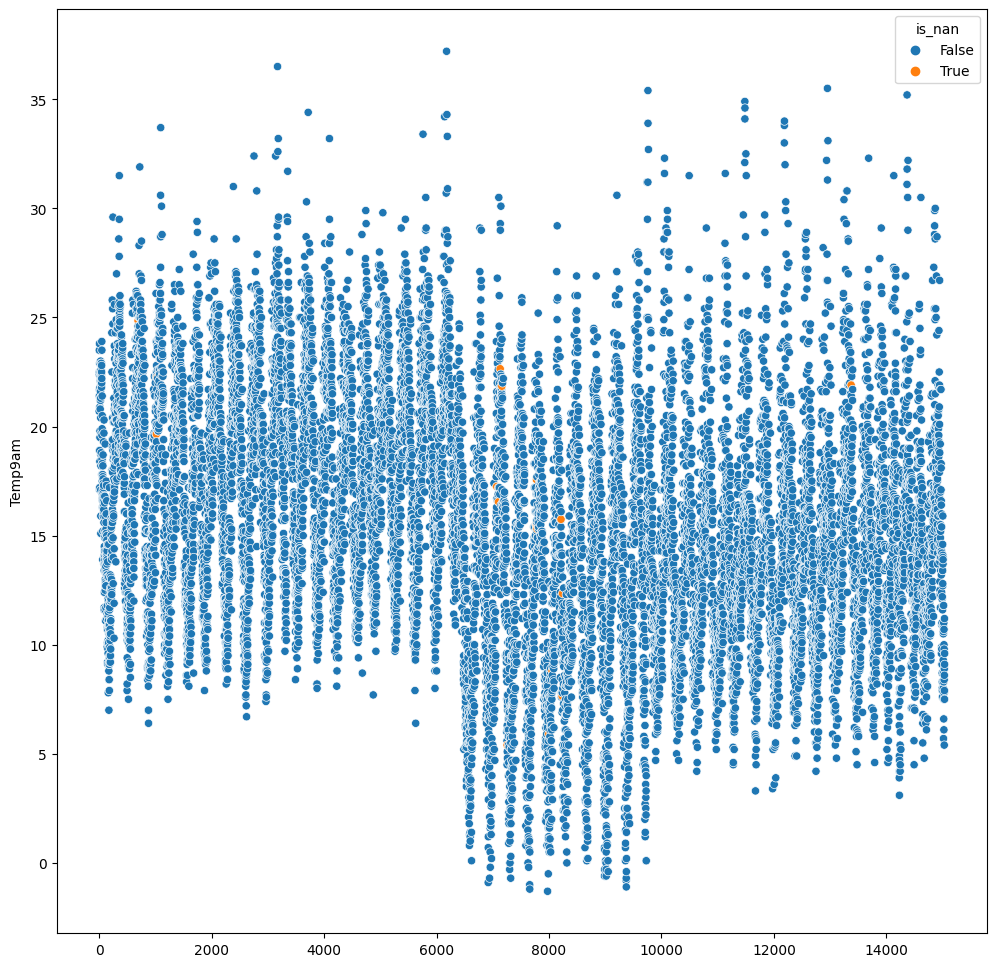

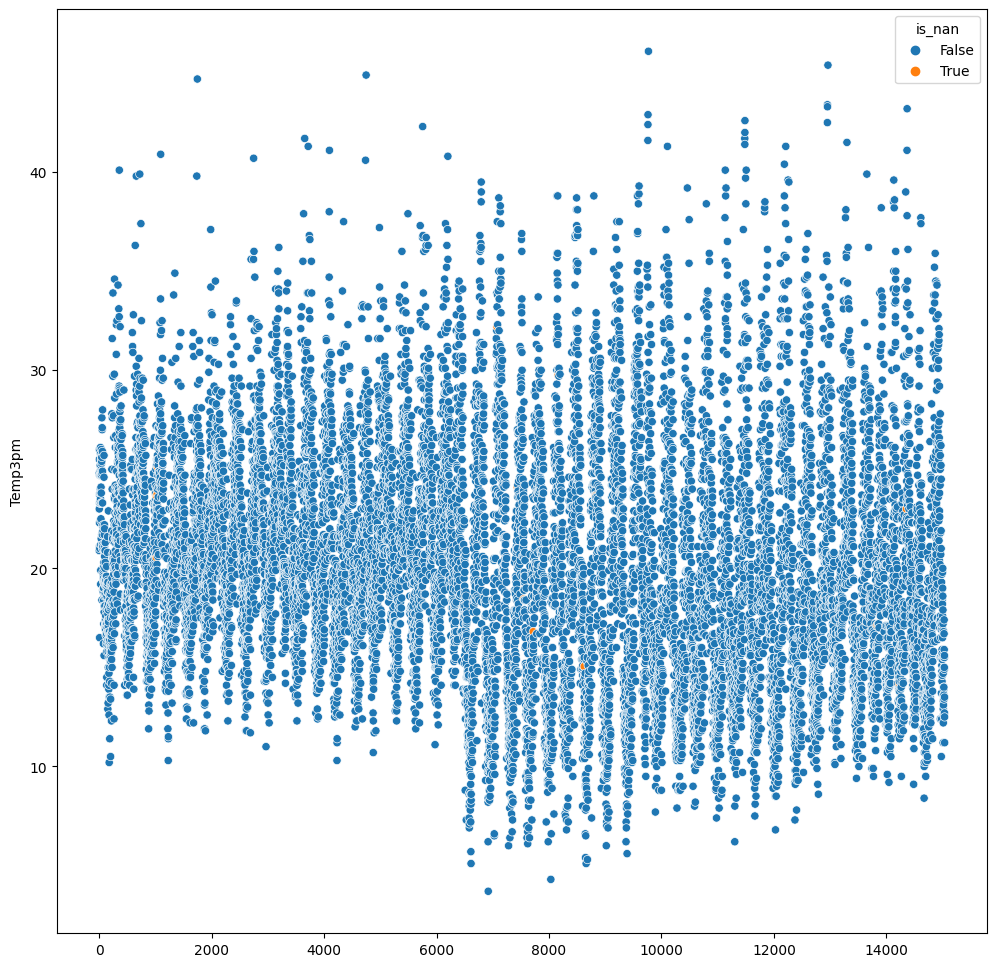

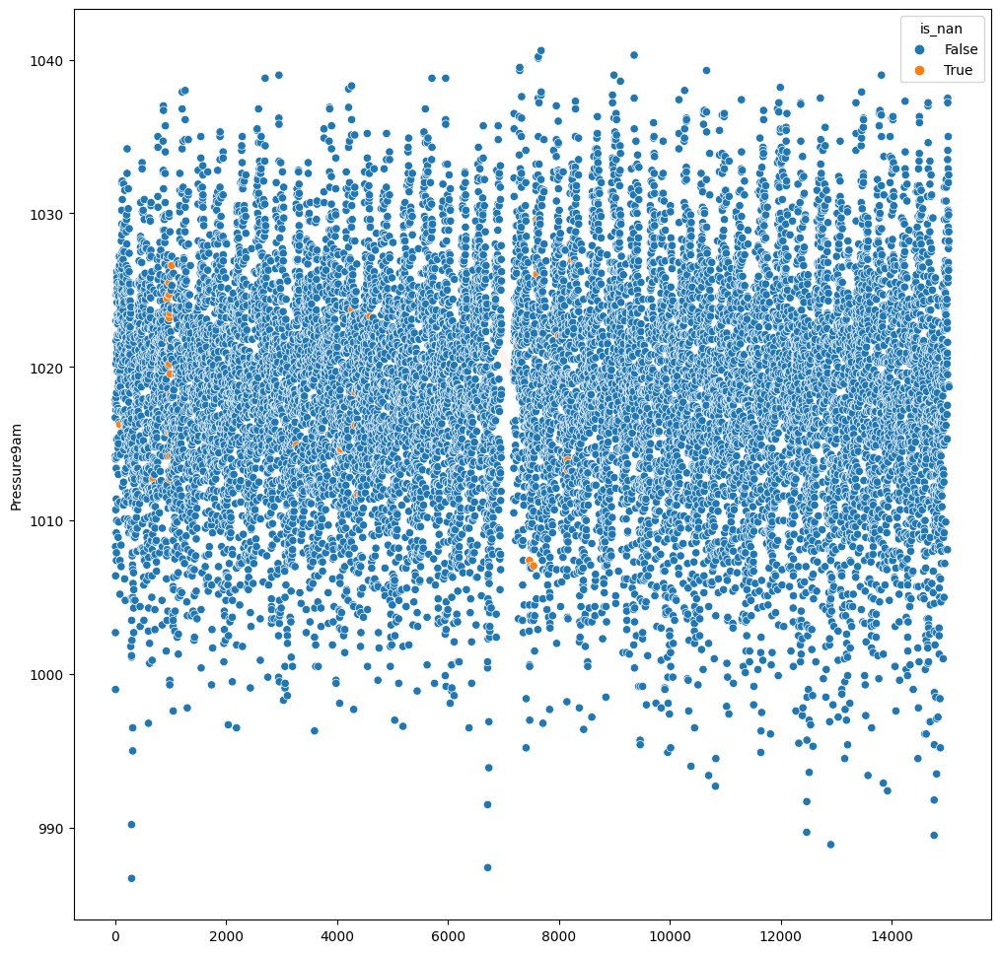

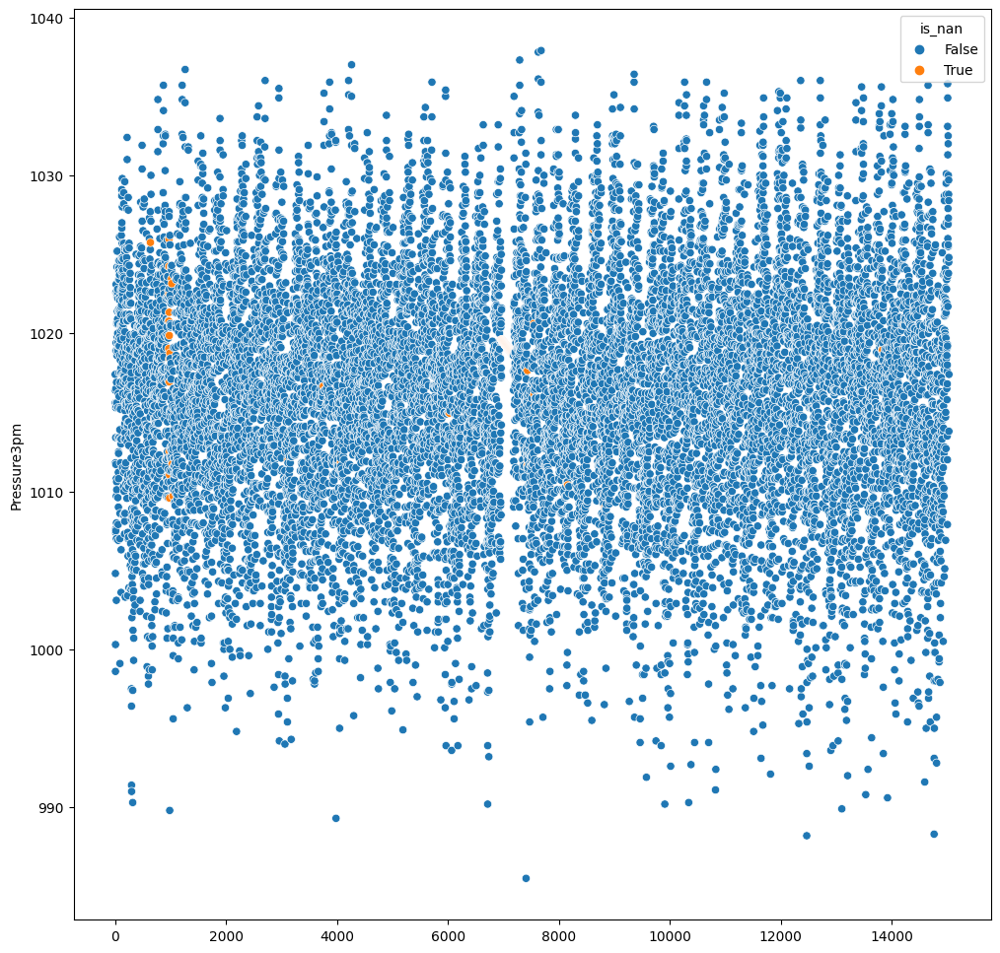

In [12]:
linear_cols = ["MinTemp", "MaxTemp", "Temp9am", "Temp3pm", "Pressure9am", "Pressure3pm"]
for c in linear_cols:
    base_dataset.plot_interpolated_scatter([c], method="slinear", sy=1)

<p> Vemos que la interpolacion lineal se ajusta bien para "MinTemp", "MaxTemp", "Temp9am", "Temp3pm", "Pressure9am", "Pressure3pm"</p>

In [13]:
for col in linear_cols:
    base_dataset.df[col].interpolate(method="slinear", inplace=True)
    print( f"{col} valores nulos : {base_dataset.df[col].isnull().sum()}")

MinTemp valores nulos : 0
MaxTemp valores nulos : 0
Temp9am valores nulos : 0
Temp3pm valores nulos : 0
Pressure9am valores nulos : 0
Pressure3pm valores nulos : 0


### Interpolando WindgustSpeed
---
<p> Para interpolar WindgustSpeed siendo que tiene gran cantidad de valores nulos consecutivos, utilizaremos la velocidad maxima registrada entre WindSpeed9am y WindSpeed3pm para cada celda que WindgustSpeed tenga valores nulos. </p>

In [14]:
def replace_nan_with_max(row):
    if  np.isnan(row["WindGustSpeed"]):
        
        max_values = max(row["WindSpeed9am"], row["WindSpeed3pm"])
        
        if np.isnan(max_values) and np.isnan(row["WindSpeed9am"]):
            #print(f"9am {row['WindSpeed9am']} | 3pm {row['WindSpeed3pm']} | Gust{row['WindGustSpeed']} | replaced {max_values}")
            return row["WindSpeed3pm"]
        elif np.isnan(max_values) and np.isnan(row["WindSpeed3pm"]):
            #print(f"9am {row['WindSpeed9am']} | 3pm {row['WindSpeed3pm']} | Gust{row['WindGustSpeed']} | replaced {max_values}")
            return row["WindSpeed9am"]
        else:
            #print(f"9am {row['WindSpeed9am']} | 3pm {row['WindSpeed3pm']} | Gust{row['WindGustSpeed']} | replaced {max_values}")
            return max_values
    else:
        #print(f"9am {row['WindSpeed9am']} | 3pm {row['WindSpeed3pm']} | Gust{row['WindGustSpeed']} | replaced {row['WindGustSpeed']}")
        return row["WindGustSpeed"]

print(base_dataset.df["WindGustSpeed"].isnull().sum())
base_dataset.df["WindGustSpeed"] = base_dataset.df.apply(replace_nan_with_max, axis=1)
print(base_dataset.df["WindGustSpeed"].isnull().sum())

1434
229


<p> Mas adelante, cuando entendamos mejor la correlacion de los datos de nuestro dataset y tengamos todas las variables categoricas definidas, vamos a intentar realizar distintos modelos para poder completar los valores nulos del dataset original para <b> Sunshine </b> y <b> Evaporation </b>. </p>



## Generar encodings para variable categoricas no numericas
---


<p> Vamos a generar un nuevo dataset para usar para la interpolacion. </p>
<p> Pero primero vamos a generar el encoding de las variables en el dataset original para no repetir este proceso dos veces</p>

### Encoding de la variable Date
<p> Se consideraron de formas de realizar el encoding de la variable fecha uno generando dummy variables y la otra usando transformacion de sine/coseno.</p>
<p> Descartamos el encoding utilizando dummy variables ya que el modelo creceria mucho en tamano en termino de variables explicativas.</p>
<p> Teniendo en cuenta que estamos evaluando el clima, el cual empiricamente sabemos que posee comportamiento ciclico, se procede a utilizar los dias del año como referencia temporal y se aplica transformacion de coseno como se detalla a continuacion.</p>


In [15]:
base_dataset.df['Date']= pd.to_datetime(base_dataset.df['Date'])
base_dataset.df['Month']= base_dataset.df['Date'].dt.month
base_dataset.df['DayOfYear']= base_dataset.df['Date'].dt.day_of_year

base_dataset.df["Month"].value_counts().sort_index()
base_dataset.df["DayOfYear"].value_counts().sort_index()


DayOfYear
1      44
2      45
3      44
4      44
5      44
       ..
362    38
363    38
364    38
365    37
366     8
Name: count, Length: 366, dtype: int64

/tmp/ipykernel_29960/3959963602.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["month_sin"] = base_dataset.sin_transformer(12).fit_transform(df)["Month"]
/tmp/ipykernel_29960/3959963602.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["month_cos"] = base_dataset.cos_transformer(12).fit_transform(df)["Month"]
/tmp/ipykernel_29960/3959963602.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

S

Text(0.5, 0.98, 'Encoding cíclico con transformaciones de seno/coseno')

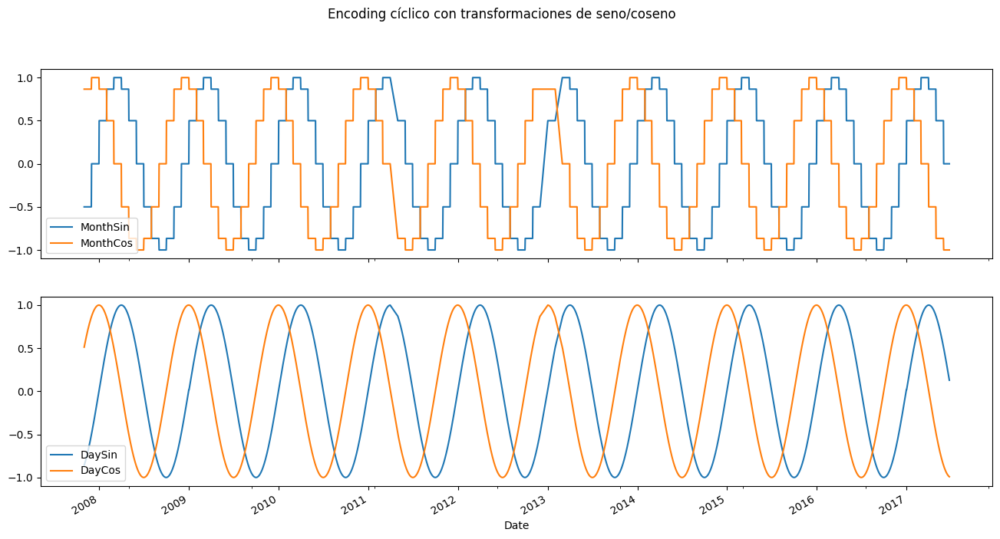

In [16]:
# Generamos un dataset temporal para poder hacer la transformación

df = base_dataset.df[["Month","DayOfYear"]]

df["month_sin"] = base_dataset.sin_transformer(12).fit_transform(df)["Month"]
df["month_cos"] = base_dataset.cos_transformer(12).fit_transform(df)["Month"]

df["day_sin"] = base_dataset.sin_transformer(365).fit_transform(df)["DayOfYear"]
df["day_cos"] = base_dataset.cos_transformer(365).fit_transform(df)["DayOfYear"]

# Añadimos las columnas al dataset original y graficamos el resultado
base_dataset.df[["MonthSin","MonthCos","DaySin","DayCos"]] = df[["month_sin","month_cos","day_sin","day_cos"]]
fig, ax = plt.subplots(2, 1, sharex=True, figsize=(16,8))
base_dataset.df[["MonthSin","MonthCos","Date"]].plot(ax=ax[0], x="Date")
base_dataset.df[["DaySin","DayCos","Date"]].plot(ax=ax[1], x="Date")
plt.suptitle("Encoding cíclico con transformaciones de seno/coseno")

<p> Nos quedaramos con la transformacion de coseno de los dias del año </p>

In [17]:
[ base_dataset.df.drop( col, axis=1, inplace=True) for col in ["MonthSin","MonthCos","DaySin","Month","DayOfYear", "Date"] ]


[None, None, None, None, None, None]

### Enconding para las variables explicativas
---

<p> Para variables Yes/No como RainToday and RainTomorrow generamos encoding binarios asignando 1 y 0 respectivamente. </p>
<p> Para variables que describen las direcciones del viento, las colapsamos en 4 valores N,S,W y E y se generaron valores dummies. </p> 
<p> Se realiza un planteo si Location deberia simplificarse y colapsar las zonas mas cercanas, pero un modelo real, por lo que se unificaran Sydney con SydneyAirport y Melbourne con MelbourneAirport.
Se generan los dummy encodings para esta categoria.</p>

In [18]:
base_dataset.df.Location.value_counts()

Location
Canberra            3401
Sydney              3330
MelbourneAirport    3008
SydneyAirport       3000
Melbourne           2297
Name: count, dtype: int64

In [19]:
base_dataset.df.Location.replace({'SydneyAirport': "Sydney", 'MelbourneAirport': "Melbourne"}, inplace=True)
print( base_dataset.df.Location.value_counts() )
one_hot_encoding=pd.get_dummies(base_dataset.df.Location, dtype=int)
print(one_hot_encoding.columns)
base_dataset.df.drop("Location", axis=1, inplace=True)
base_dataset.df = base_dataset.df.join(one_hot_encoding)


Location
Sydney       6330
Melbourne    5305
Canberra     3401
Name: count, dtype: int64
Index(['Canberra', 'Melbourne', 'Sydney'], dtype='object')


In [20]:
from sklearn.preprocessing import LabelEncoder

cardinal_points_map = {
    "N" : "^N.*$",
    "S" : "^S.*$",
    "W" : "^W.*$",
    "E" : "^E.*$"
}

for k,v in cardinal_points_map.items():
    base_dataset.df.WindGustDir.replace( to_replace=v, value=k, regex=True, inplace=True)
    base_dataset.df.WindDir3pm.replace( to_replace=v, value=k, regex=True, inplace=True)
    base_dataset.df.WindDir9am.replace( to_replace=v, value=k, regex=True, inplace=True)

one_hot_encoding=pd.get_dummies(base_dataset.df.WindGustDir, dtype=int, prefix="WindGustDir_")
base_dataset.df.drop("WindGustDir", axis=1, inplace=True)
base_dataset.df= base_dataset.df.join(one_hot_encoding)

one_hot_encoding=pd.get_dummies(base_dataset.df.WindDir9am, dtype=int,  prefix="WindDir9am_")
base_dataset.df.drop("WindDir9am", axis=1, inplace=True)
base_dataset.df = base_dataset.df.join(one_hot_encoding)

one_hot_encoding=pd.get_dummies(base_dataset.df.WindDir3pm, dtype=int,  prefix="WindDir3pm_")
base_dataset.df.drop("WindDir3pm", axis=1, inplace=True)
base_dataset.df = base_dataset.df.join(one_hot_encoding)

le = LabelEncoder()
base_dataset.df["RainToday"] = le.fit_transform(base_dataset.df.RainToday)
base_dataset.df["RainTomorrow"] = le.fit_transform(base_dataset.df.RainTomorrow)
base_dataset.df


,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,...,WindGustDir__S,WindGustDir__W,WindDir9am__E,WindDir9am__N,WindDir9am__S,WindDir9am__W,WindDir3pm__E,WindDir3pm__N,WindDir3pm__S,WindDir3pm__W
30167,19.5,22.4,15.6,6.2,0.0,20.0,17.0,20.0,92.0,84.0,...,0,0,0,0,1,0,0,0,1,0
30168,19.5,25.6,6.0,3.4,2.7,13.0,9.0,13.0,83.0,73.0,...,0,0,0,0,0,1,1,0,0,0
30169,21.6,24.5,6.6,2.4,0.1,17.0,17.0,2.0,88.0,86.0,...,0,0,1,0,0,0,1,0,0,0
30170,20.2,22.8,18.8,2.2,0.0,22.0,22.0,20.0,83.0,90.0,...,0,0,0,1,0,0,1,0,0,0
30171,19.7,25.7,77.4,NaN,0.0,11.0,11.0,6.0,88.0,74.0,...,0,0,0,1,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
70366,6.4,15.8,0.0,2.4,8.8,39.0,11.0,17.0,84.0,56.0,...,0,0,0,1,0,0,0,1,0,0
70367,7.8,13.5,0.6,0.6,0.0,24.0,2.0,9.0,100.0,80.0,...,0,0,0,0,0,1,0,0,1,0
70368,6.7,14.1,0.2,0.6,0.0,24.0,9.0,11.0,93.0,56.0,...,0,0,0,1,0,0,0,1,0,0
70369,7.4,14.9,0.0,1.6,6.0,44.0,17.0,19.0,77.0,63.0,...,0,0,0,1,0,0,0,1,0,0


## Outliers
---


/home/simon/.local/lib/python3.10/site-packages/numpy/linalg/linalg.py:2139: RuntimeWarning: invalid value encountered in det
  r = _umath_linalg.det(a, signature=signature)
/home/simon/.local/lib/python3.10/site-packages/numpy/linalg/linalg.py:2139: RuntimeWarning: invalid value encountered in det
  r = _umath_linalg.det(a, signature=signature)
/home/simon/.local/lib/python3.10/site-packages/numpy/linalg/linalg.py:2139: RuntimeWarning: invalid value encountered in det
  r = _umath_linalg.det(a, signature=signature)
/home/simon/.local/lib/python3.10/site-packages/numpy/linalg/linalg.py:2139: RuntimeWarning: invalid value encountered in det
  r = _umath_linalg.det(a, signature=signature)
/home/simon/.local/lib/python3.10/site-packages/numpy/linalg/linalg.py:2139: RuntimeWarning: invalid value encountered in det
  r = _umath_linalg.det(a, signature=signature)
/home/simon/.local/lib/python3.10/site-packages/numpy/linalg/linalg.py:2139: RuntimeWarning: invalid value encountered in det
  r 

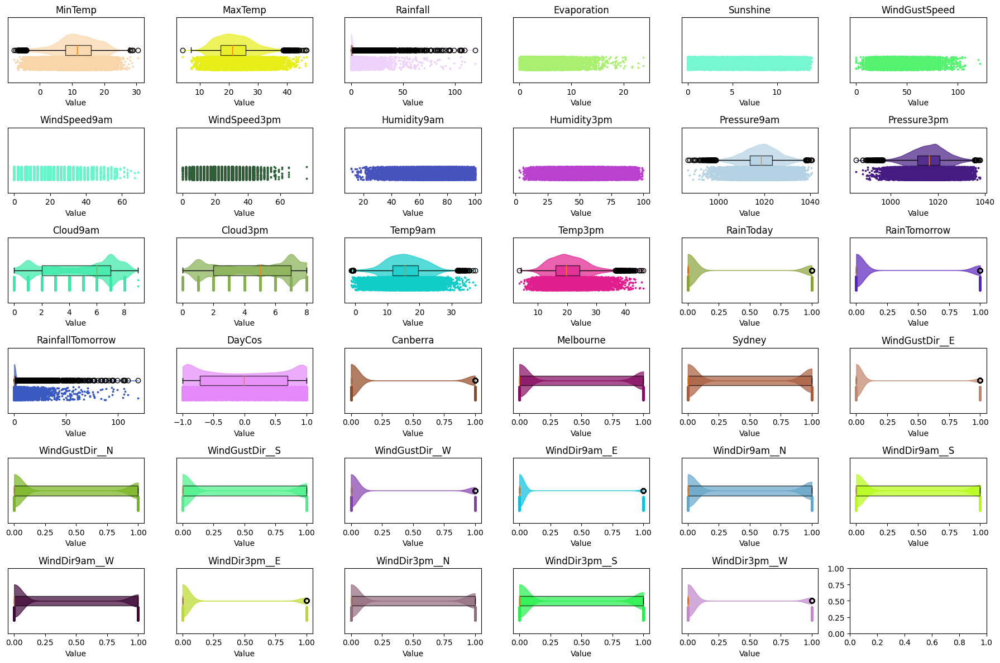

<Figure size 640x480 with 0 Axes>

In [21]:
base_dataset.plot_boxplot()

## PCA
---

PCA es muy sensible a los valores <b>outliers</b> pero vamos a graficarlo de todas formas para ver como se distribuye la varianza para nuestros datos y cuantas componentes necesitamos para dar explicabilidad a nuestro modelo.

[1.71560564e-01 1.19985395e-01 1.09393340e-01 7.92236906e-02
 7.43997029e-02 4.91355265e-02 4.13092979e-02 3.70270702e-02
 3.23864243e-02 2.90529475e-02 2.68071564e-02 2.52531376e-02
 2.31702366e-02 1.97622009e-02 1.87629067e-02 1.74902910e-02
 1.57851723e-02 1.52194328e-02 1.34565224e-02 1.21422654e-02
 1.19615775e-02 1.10631032e-02 1.08208533e-02 8.27196873e-03
 7.80029480e-03 6.68321294e-03 4.79973982e-03 2.74663726e-03
 1.81189230e-03 8.82406438e-04 6.76213989e-04 5.99761163e-04
 4.47998595e-04 1.11059065e-04 3.38343554e-32]


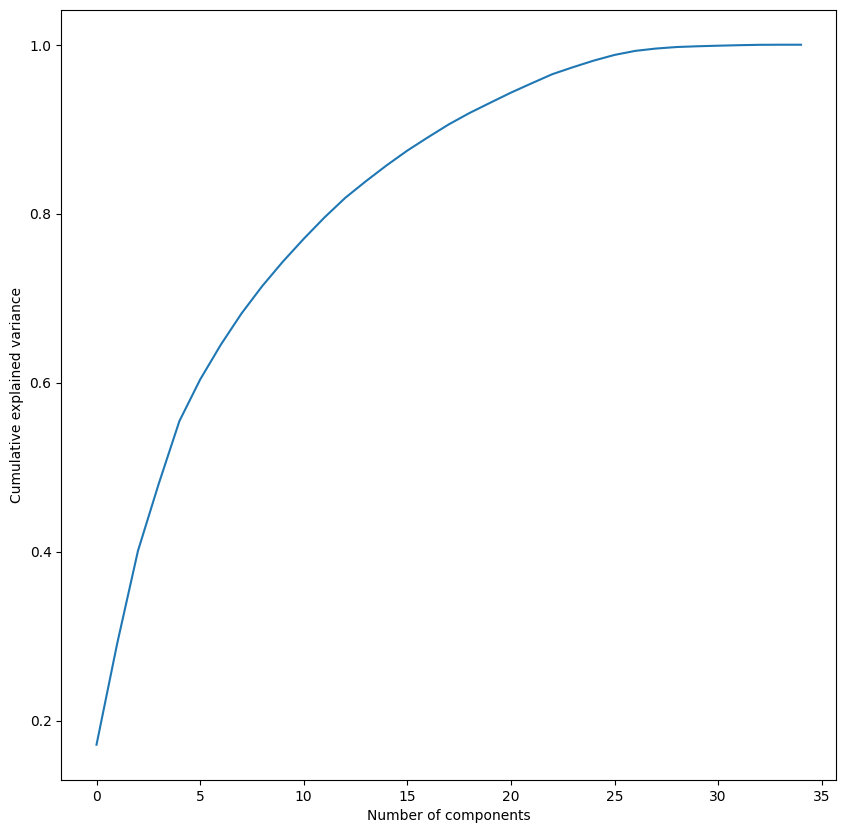

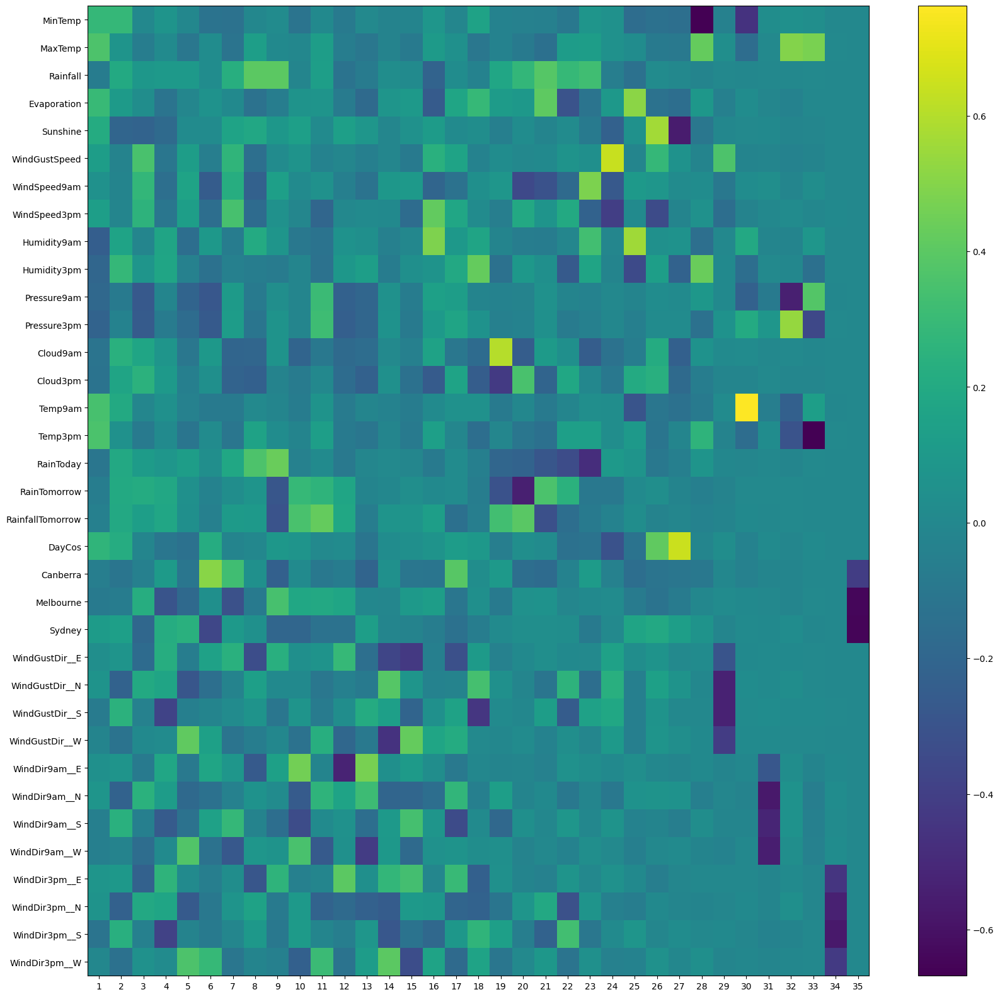

In [22]:
pca = base_dataset.plot_PCA()

### Matriz de correlacion
---

<p> Generamos la matriz de correlacion para entender como se relacionan nuestro variables </p>
<p> Se utilizaran estos datos para generar los mejores datos posibles para completar los valores nulos de nuestras features que faltan interpolar, definir que variables pueden ser ignoradas para simplificar nuestro dataset y eliminar variables que tengan correlacion > 0.9 entre si.</p>

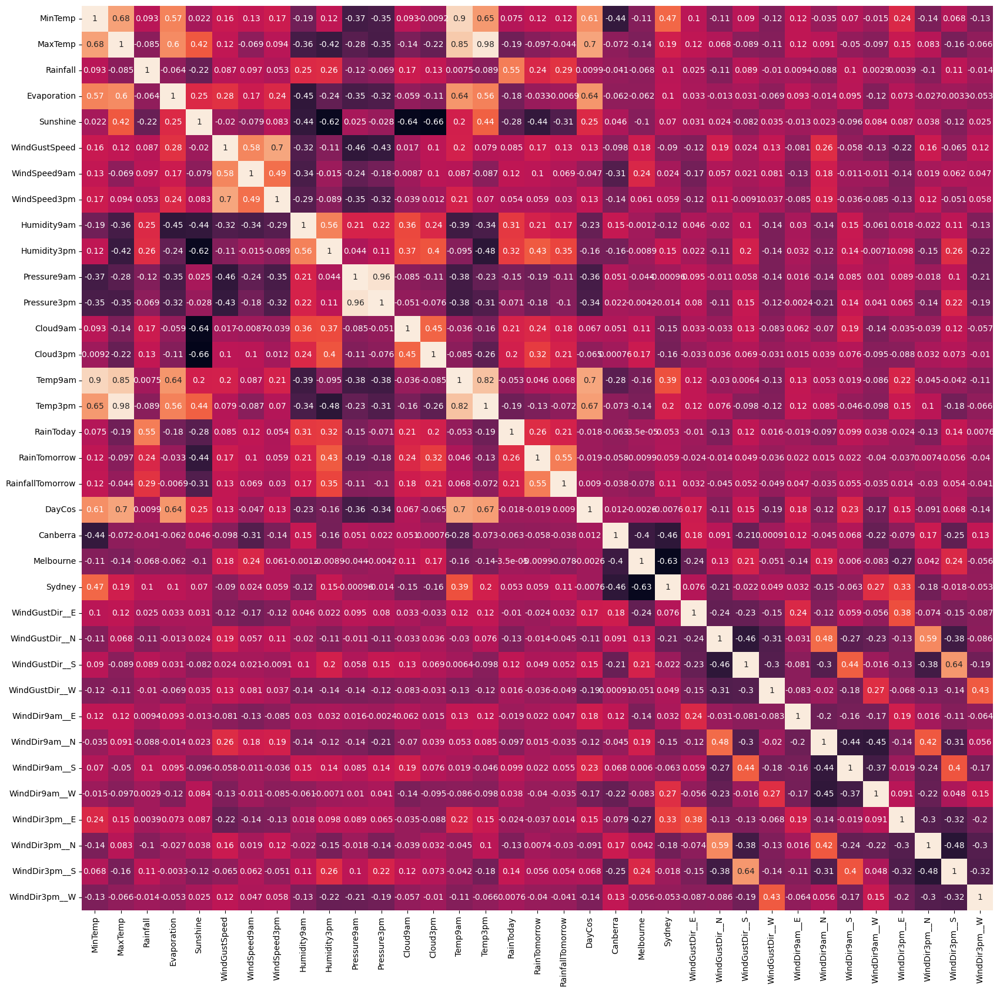

In [23]:
#base_dataset.plot_correlation()
base_dataset.df.columns
base_dataset.plot_correlation(figsize=(20,20))

# Primera conclusion
---

<p> Viendo que la varianza acumalada en PCA supera al menos el 85% de su varianza con casi 20 variables y analizando la matriz de correlacion deducimos que no se encuentra fuerte correlacion lineal entre las diferentes variables independientes con nuestras variables objetivos, podemos presumir tempranamente que los modelos lineales no seran muy efectivos con nuestro dataset.</p>

<p> Notamos la existencia de muchos outliers en las diferentes features y en las variables objetivos: Rainfall y RainfallTomorrow, por lo que metricas como MSE para los modelos de regresion lineal podrian verse afectadas.</p>


<p> Procedemos a :</p>
<p>- borrar las variables extremadamente correlacionadas como MaxTemp y MinTemp dejando Temp9am y Temp3pm.</p>
<p>- borrar las variables de direccion de vientos, ya que no dan explicabilidad sobre las features que no sean direccion de vientos y sobre nuestras variables objetivos</p>


In [24]:
wind_cols = [col for col in base_dataset.df.columns if "WindDir" in col or "WindGustDir" in col]
drop_cols = [ "MinTemp", "MaxTemp"] + wind_cols
print(f"Cols to drop {drop_cols}")
base_dataset.df.drop(drop_cols, inplace=True, axis=1)

Cols to drop ['MinTemp', 'MaxTemp', 'WindGustDir__E', 'WindGustDir__N', 'WindGustDir__S', 'WindGustDir__W', 'WindDir9am__E', 'WindDir9am__N', 'WindDir9am__S', 'WindDir9am__W', 'WindDir3pm__E', 'WindDir3pm__N', 'WindDir3pm__S', 'WindDir3pm__W']


## Regresion Lineal sobre variables explicativas
---

### Funcion de prediccion para interpolacion de features
---

In [25]:
def predict_interpolation_values(df : pd.DataFrame, x_cols : list["str"], y_cols : list["str"]):
    results : list = []

    for y_col in y_cols:
        temp_interpolation = BaseDataset()
        temp_interpolation.df = base_dataset.df.copy()

        print( "Total nulls for evaporation : ", temp_interpolation.df[y_col].isnull().sum())
        x_pred, x_train, x_test, y_train, y_test = temp_interpolation.split_dataset( x_train_cols=x_cols, y_train_col=y_col, test_size=0.2, shuffle_ds=False)
        model, y_pred, r2, mse, mae = temp_interpolation.linear_regresion()
        print( "Total nulls predicted: ",len(x_pred))
        y_pred = temp_interpolation.linear_prediction(x_pred=x_pred)
        x_pred[y_col] = y_pred
        print(f"R2: {r2} | MSE: {mse} | MAE: {mae}")
        results.append( (x_pred, r2, mse, mae) )
    return results


<p> Creamos un dataset temporal nuevo para poder los valores sin afectar el dataset original </p>

### Variable  Sunshine
---
<p> Usaremos las variables correlacionadas para interpolar utilizando un modelo lineal para interpolar los datos </p>
<p> Vemos que un R2 de 0.7 generamos muchos mejores resultados que utilizando metodos de interpolacion provistos por pandas </p>

In [26]:
temp_interpolation_cols_x = ["Temp3pm", "Cloud9am", "Cloud3pm","Humidity9am","Humidity3pm","DayCos"]
temp_interpolation_cols_y = ["Sunshine"]

x_pred, r2, mse, mae = predict_interpolation_values(base_dataset.df, temp_interpolation_cols_x, temp_interpolation_cols_y)[0]
    

Total nulls for evaporation :  1931
Total nulls predicted:  1912
R2: 0.6626637550668042 | MSE: 5.18852784911513 | MAE: 1.7941978096029778


<p> Actulizamos el dataframe original con los datos predichos y graficamos la interpolacion para asegurarnos de que se ajusto bien a los datos obtenidos </p>
<p> Graficamos para comparar las diferencia entre interpolar usando pandas y utilizando el modelo lineal generado </p>

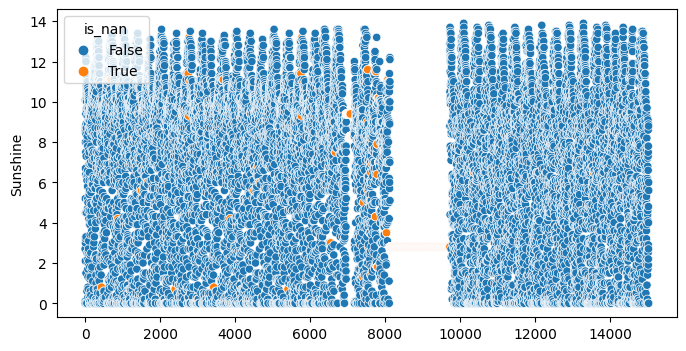

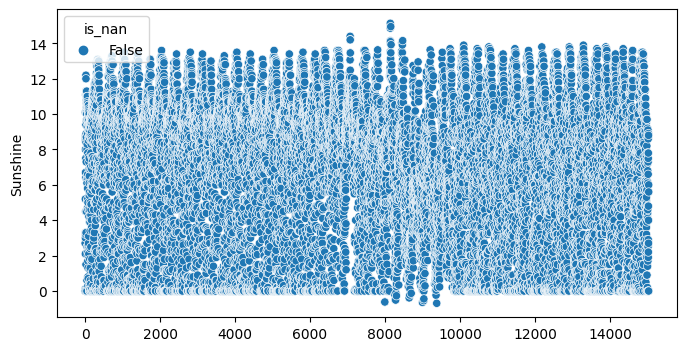

In [27]:
base_dataset.plot_interpolated_scatter(["Sunshine"], method="nearest", sy=1, fsize=(8,4))
base_dataset.df.update(x_pred["Sunshine"], errors="raise")
base_dataset.df["Sunshine"].isnull().sum()
base_dataset.df["Sunshine"].interpolate(method="nearest", inplace=True)
base_dataset.plot_interpolated_scatter(["Sunshine"],sy=1, fsize=(8,4))


<p> Notamos que todavia quedan algunos valores nulos, por lo que procedemos ahora si a interpolarlos con el metodo "nearest" ya que no existen brechas grandes entre los datos.</p>
<p> Vemos ademas que le regresion lineal genero algunos valores menores a 0 y mayores al maximo del dataset original, por lo que procedemos a ajustarlos tambien </p>

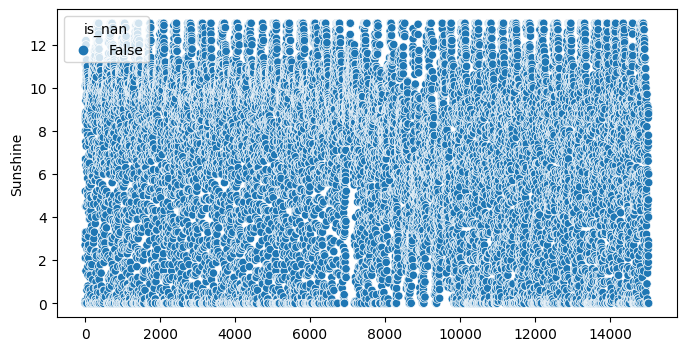

Datos nulos para la variable Sunshine: 0


In [28]:
base_dataset.df["Sunshine"] = base_dataset.df["Sunshine"].apply(lambda value: value if value >0 else 0 )
base_dataset.df["Sunshine"] = base_dataset.df["Sunshine"].apply(lambda value: value if value <=13 else 13 )
base_dataset.plot_interpolated_scatter(["Sunshine"],sy=1, fsize=(8,4))
sunshine_nulls = base_dataset.df["Sunshine"].isnull().sum()
print( f"Datos nulos para la variable Sunshine: {sunshine_nulls}")

### Interpolando Evaporation
---
<p> Siguiendo el mismo metodo utilizamos un modelo lineal para predecir datos nulos de evaporacion. </p>
<p> Utilizamos las variables Temp9am, Temp3pm, Humidity9am, DayCos, Pressure9am, Pressure3pm </p>

In [29]:
temp_interpolation_cols_x = ["Temp9am", "Temp3pm", "Humidity9am","Humidity3pm", "Pressure9am", "Pressure3pm", "DayCos"]
temp_interpolation_cols_y = ["Evaporation"]

x_pred, r2, mse, mae = predict_interpolation_values(base_dataset.df, temp_interpolation_cols_x, temp_interpolation_cols_y)[0]


Total nulls for evaporation :  1681
Total nulls predicted:  1666
R2: 0.5755253420026003 | MSE: 4.713272058393275 | MAE: 1.5530835774340848


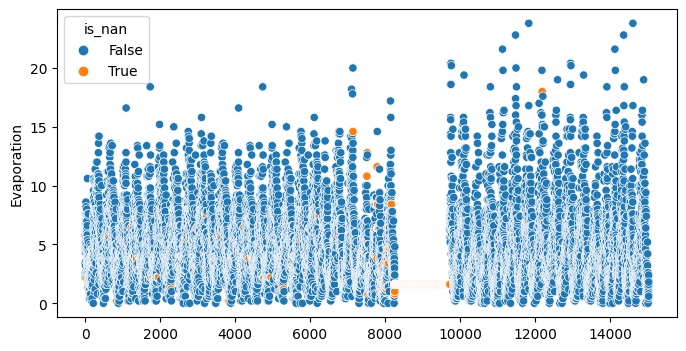

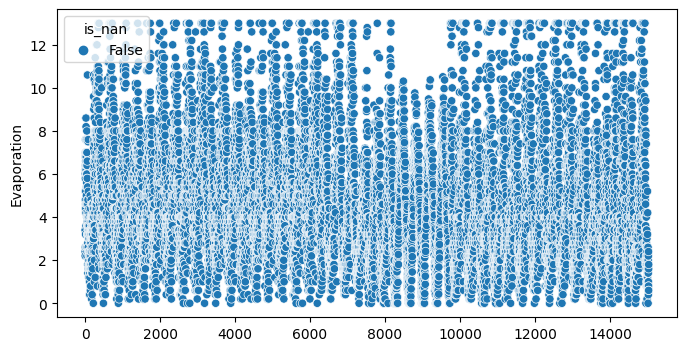

Datos nulos para la variable Evaporation: 0


In [30]:
base_dataset.plot_interpolated_scatter(["Evaporation"], method="nearest", sy=1, fsize=(8,4))
base_dataset.df.update(x_pred["Evaporation"], errors="raise")
base_dataset.df["Evaporation"].isnull().sum()
base_dataset.df["Evaporation"].interpolate(method="nearest", inplace=True)
# Evaporation tiene valores negativos predichos por el modelo, por lo que los convertimos a 0
base_dataset.df["Evaporation"] = base_dataset.df["Evaporation"].apply(lambda value: value if value >0 else 0 )
base_dataset.df["Evaporation"] = base_dataset.df["Evaporation"].apply(lambda value: value if value <=13 else 13 )
base_dataset.plot_interpolated_scatter(["Evaporation"],sy=1, fsize=(8,4))
sunshine_nulls = base_dataset.df["Evaporation"].isnull().sum()
print( f"Datos nulos para la variable Evaporation: {sunshine_nulls}")


<p> 

## Conclusion de interpolacion y tratamiento de los valores nulos
---

<p> Vemos cuantos filas con valores nulos quedaron en nuestro dataset </p>

In [31]:
print( f"Total rows: {base_dataset.df.shape[0]} | Total nulls: {base_dataset.get_amount_of_rows_with_missing_vals()} | {base_dataset.get_percent_of_row_with_missing_vals()}% of null values ")

Total rows: 15036 | Total nulls: 376 | 2.500665070497473% of null values 


<p> Vemos que redujimos el numero de filas con valores nules al 2.5 %. </p>

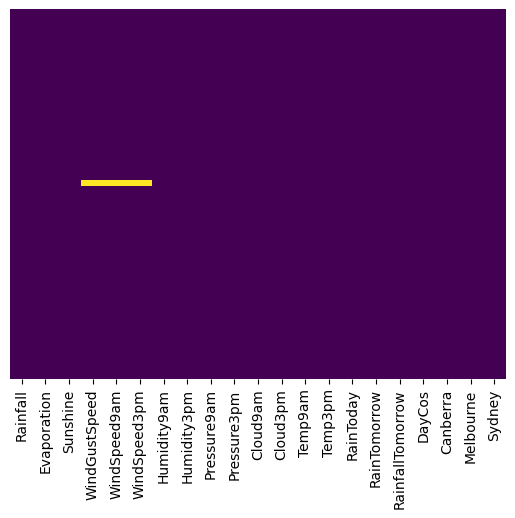

In [32]:
base_dataset.plot_nulls()
base_dataset.df.dropna(inplace=True)


### Viendo distribucion de las variables
---

<p> Graficamos las distribuacion de las variables con respecto a una de las variable objetivo por ejemplo para la regresion logistica para entender un poco mas el dataset </p>
<p> Vemos que el dataset no esta correctamente balanceado a simple vista, y que hay mayor numeros de dias que no llovio. </p>

<Figure size 640x480 with 0 Axes>

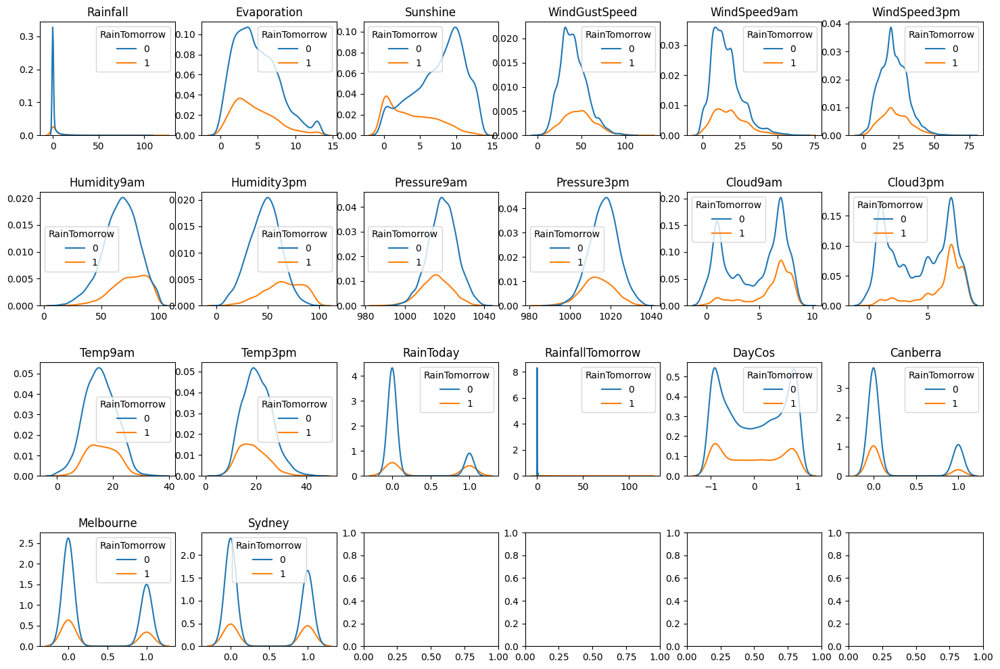

In [33]:
base_dataset.plot_distributions(y_col="RainTomorrow")


## Split datasets
---

<p> Ya con el dataset interpolado, procedemos a generar el split del dataset. </p>
<p> La funcion de split generara un shuffle sobre los datos para ayudar overfitting y sesgo en los modelos y pode realizar mejores predicciones. </p>
<p> Vamos a generar un dataset para cada modelo de regresion. </p>
<p> Borraremos las columnas de cada dataset que podrian introducir ruido y overfitting en nuestros modelos por estar tan altamente correlacionadas.</p>
<p> Usamos

In [34]:
rainfall_tomorrow_ds_linear = BaseDataset()
rain_tomorrow_ds_logistic  = BaseDataset()

rainfall_tomorrow_ds_linear.df = base_dataset.df.copy()

rain_tomorrow_ds_logistic.df = base_dataset.df.copy()

rainfall_tomorrow_ds_linear.df.drop(["RainTomorrow"], axis=1, inplace=True)

rain_tomorrow_ds_logistic.df.drop(["RainfallTomorrow"], axis=1, inplace=True)

In [35]:
rainfall_tomorrow_ds_linear.split_dataset( x_train_cols=rainfall_tomorrow_ds_linear.df.columns.drop("RainfallTomorrow"), y_train_col="RainfallTomorrow", test_size=0.2, shuffle_ds=True)

rain_tomorrow_ds_logistic.split_dataset( x_train_cols=rain_tomorrow_ds_logistic.df.columns.drop("RainTomorrow"), y_train_col="RainTomorrow", test_size=0.2, shuffle_ds=True, stratify_y=True)

print("Datasets splitted")


Datasets splitted


## Normalizando Datasets
---

<p> Procedemos a normalizar los datasets ya divididos en train y tests </p>

<p> Entendiendo las variables objetivos para la regresion lineal</p>

In [36]:
print( f" RainfallTomorrow Var :{np.var(rainfall_tomorrow_ds_linear.y_train)} | Min val: {np.min(rainfall_tomorrow_ds_linear.y_train)} | Max val: {np.max(rainfall_tomorrow_ds_linear.y_train)}")

 RainfallTomorrow Var :53.416157638161216 | Min val: 0.0 | Max val: 119.4


In [37]:
rainfall_tomorrow_ds_linear.scale_ds(scale_target=False)
rain_tomorrow_ds_logistic.scale_ds(scale_target=False)

print("Datasets scaled")

Datasets scaled


In [38]:
print( f"Scaled Rainfall Var: {np.var(rainfall_tomorrow_ds_linear.y_train)} | Min: {rainfall_tomorrow_ds_linear.y_train.min()} | Max : {rainfall_tomorrow_ds_linear.y_train.max()}" )

Scaled Rainfall Var: 53.416157638161216 | Min: 0.0 | Max : 119.4


## Balanceo de Clases
---

Podemos ver que hay una desproporción en la cantidad de casos de lluvia con los de no lluvia. Si utilizamos el dataset como actualmente está obtendremos un modelo sesgado que tendrá preferencia por los dias de no lluvia. Para esto podemos utilizar diferentes técnicas para mantener el dataset proporcionado:
* Pesos de clase: A la clase LogisticRegression podemos setear el parámetro class_weight a "balanced" para dar más peso a los registros de lluvia
* Submuestreo: Eliminar registros de no lluvia hasta equiparar los de lluvia.
* Sobremuestreo: Generar información sintética para aumetar los registros de lluvia.

RainTomorrow
0    11285
1     3375
Name: count, dtype: int64

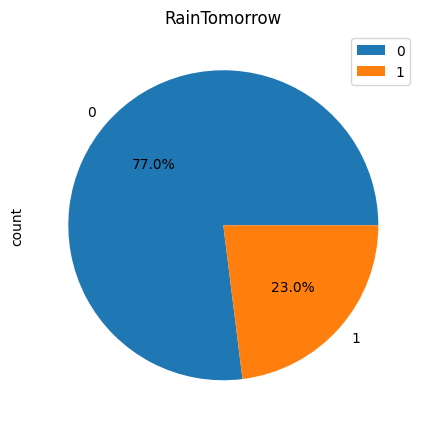

In [39]:
base_dataset.plot_pie_classes("RainTomorrow", title="RainTomorrow", figsize=(5,10), args={ "legend": True, "autopct":'%1.1f%%'})

## Smote para la regresion logistica
---
<p> Ya con nuestros datasets divididos y normalizados, procedemos a implementar Smote y undersample para balancear las clases de los datasets que se van a utilizar para la regresion logistica </p>

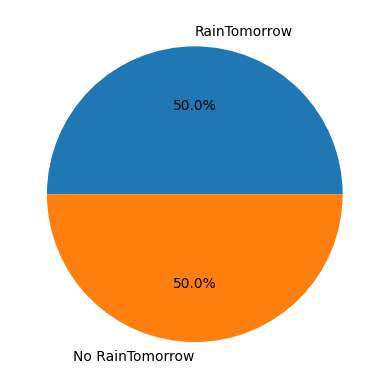

In [40]:
rain_tomorrow_ds_logistic.smote_ds(inplace=True)
plt.figure()
plt.pie(rain_tomorrow_ds_logistic.y_train.value_counts(), labels=["RainTomorrow", "No RainTomorrow"], autopct='%1.1f%%' )
plt.show()

# Regresiones Lineales
---

## Regresion lineal
---

In [41]:
def linearRegressionModel(x_train, y_train, x_test, y_test):
    model = LinearRegression()
    model.fit(x_train, y_train)
    y_pred = model.predict(x_test)


    r2 = r2_score(y_test,y_pred)
    m_e2 = mean_squared_error(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    print (f"score R2: {round(r2, 4)}")
    print (f"error MSE: {round(m_e2, 4)}") 
    print (f"error MAE: {round(mae, 4)}")
    return y_pred, r2, m_e2, mae, model

def plot_linear_regression(y_test, y_pred, title=""):
    plt.scatter(y_test, y_test ,  label='True', color='blue')
    plt.scatter(y_test, y_pred ,  label='Predicted', color='orange')
    plt.legend()
    plt.title(title)
    plt.show()

## Regresion Lineal RainfallTomorrow
---

score R2: 0.2166
error MSE: 45.3967
error MAE: 3.2131


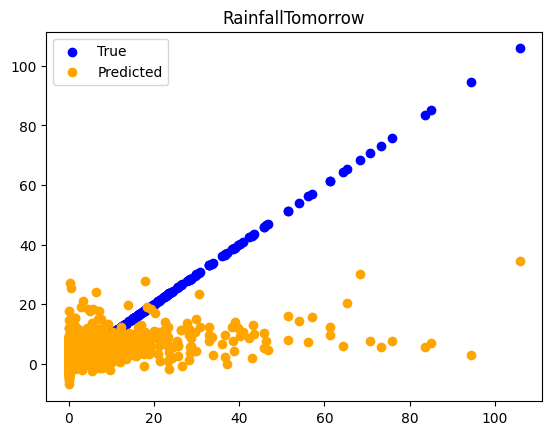

In [42]:
lr = linearRegressionModel(rainfall_tomorrow_ds_linear.x_train, rainfall_tomorrow_ds_linear.y_train, rainfall_tomorrow_ds_linear.x_test, rainfall_tomorrow_ds_linear.y_test)
plot_linear_regression(rainfall_tomorrow_ds_linear.y_test, lr[0], title="RainfallTomorrow")

<p> Vemos que el modelo no da buen resultado para las regresiones lineales, no se ajusta lo suficientemente bien para poder realizar prediciones correctas. </p>
<p> Existe la presencia de muchos outliers ya que hay dias de abundante lluvia pero la mayoria del ano no llueve, por lo que hace muy dificil ajustar un modelo lineal a los datos </p>

In [43]:
from typing import Literal
from sklearn.linear_model import Ridge, Lasso, ElasticNet, RidgeCV, ElasticNetCV, LassoCV

def linearModelsRegressors(x,y, model: Literal[
    "lasso",
    "lassoCV",
    "elastic",
    "elasticCV",
    "ridge",
    "ridgeCV"
    ], ratios = [], alphas = []):

    models = {
        "lasso": Lasso,
        "lassoCV": LassoCV,
        "elastic": ElasticNet,
        "elasticCV": ElasticNetCV,
        "ridge": Ridge,
        "ridgeCV": RidgeCV
    }

    scores = []
    m = None
    if model in ["elasticCV", "lassoCV", "ridgeCV"]:
        m = models[model]()
        m.fit(x,y)
        scores.append( (m.alpha_, m.score(x,y)) )

    if model == "elastic":
        meta_vals = zip(alphas, ratios)
        for alpha, ratio in meta_vals:
            m = models[model](alpha=alpha, l1_ratio=ratio)
            m.fit(x,y)
            scores.append( (alpha, ratio, m.score(x,y)) )

    if model in ["ridge", "lasso"]:
        for alpha in alphas:
            m = models[ model ](alpha=alpha)
            m.fit(x,y)
            scores.append( (alpha, m.score(x,y)) )


    for score in scores:
        print(f"{model}")
        print("-----------------")
        print(score)
        print("-----------------")
    return m, scores

## Regresion de Lasso
---

In [44]:

lasso_result = linearModelsRegressors (model="lasso", alphas=[0.1, 0.01, 0.001, 0.0001], x=rainfall_tomorrow_ds_linear.x_train, y=rainfall_tomorrow_ds_linear.y_train)


lasso
-----------------
(0.1, 0.22043078285470008)
-----------------
lasso
-----------------
(0.01, 0.23192823434383025)
-----------------
lasso
-----------------
(0.001, 0.2322112491169832)
-----------------
lasso
-----------------
(0.0001, 0.23221413805886137)
-----------------


In [45]:
lasso_result = linearModelsRegressors (model="lasso", alphas=[0.1, 0.01, 0.001, 0.0001], x=rainfall_tomorrow_ds_linear.x_train, y=rainfall_tomorrow_ds_linear.y_train)


lasso
-----------------
(0.1, 0.22043078285470008)
-----------------
lasso
-----------------
(0.01, 0.23192823434383025)
-----------------
lasso
-----------------
(0.001, 0.2322112491169832)
-----------------
lasso
-----------------
(0.0001, 0.23221413805886137)
-----------------


## Regresion Ridge
---

In [46]:
ridge_result = linearModelsRegressors (model="ridge", alphas=[0.1, 0.01, 0.001, 0.0001], x=rainfall_tomorrow_ds_linear.x_train, y=rainfall_tomorrow_ds_linear.y_train)

ridge
-----------------
(0.1, 0.23221416696456698)
-----------------
ridge
-----------------
(0.01, 0.232214167533341)
-----------------
ridge
-----------------
(0.001, 0.23221416753903112)
-----------------
ridge
-----------------
(0.0001, 0.23221416753908797)
-----------------


In [47]:
ridge_result = linearModelsRegressors (model="ridge", alphas=[0.1, 0.01, 0.001, 0.0001], x=rainfall_tomorrow_ds_linear.x_train, y=rainfall_tomorrow_ds_linear.y_train)

ridge
-----------------
(0.1, 0.23221416696456698)
-----------------
ridge
-----------------
(0.01, 0.232214167533341)
-----------------
ridge
-----------------
(0.001, 0.23221416753903112)
-----------------
ridge
-----------------
(0.0001, 0.23221416753908797)
-----------------


Regresion ElasticNet
---

In [48]:
elastinet_result = linearModelsRegressors (model="elastic", alphas=[0.1, 0.01, 0.001, 0.0001], ratios=[0.1, 0.3, 0.5, 0.7, 0.9], x=rainfall_tomorrow_ds_linear.x_train, y=rainfall_tomorrow_ds_linear.y_train)

elastic
-----------------
(0.1, 0.1, 0.22318223876446475)
-----------------
elastic
-----------------
(0.01, 0.3, 0.23178207174483978)
-----------------
elastic
-----------------
(0.001, 0.5, 0.2322094627451715)
-----------------
elastic
-----------------
(0.0001, 0.7, 0.23221412826046695)
-----------------


In [49]:
elastinet_result = linearModelsRegressors (model="elastic", alphas=[0.1, 0.01, 0.001, 0.0001], ratios=[0.1, 0.3, 0.5, 0.7, 0.9], x=rainfall_tomorrow_ds_linear.x_train, y=rainfall_tomorrow_ds_linear.y_train)

elastic
-----------------
(0.1, 0.1, 0.22318223876446475)
-----------------
elastic
-----------------
(0.01, 0.3, 0.23178207174483978)
-----------------
elastic
-----------------
(0.001, 0.5, 0.2322094627451715)
-----------------
elastic
-----------------
(0.0001, 0.7, 0.23221412826046695)
-----------------


## Cross Validation 
---

### Lasso CV
---

In [50]:
lasocv_result_rt = linearModelsRegressors (model="lassoCV", x=rainfall_tomorrow_ds_linear.x_train, y=rainfall_tomorrow_ds_linear.y_train)

lassoCV
-----------------
(0.003164666005813515, 0.23218529206971716)
-----------------


### RidgeCV
---

In [51]:
ridgecv_result_rt = linearModelsRegressors (model="ridgeCV", x=rainfall_tomorrow_ds_linear.x_train, y=rainfall_tomorrow_ds_linear.y_train)

ridgeCV
-----------------
(10.0, 0.23220866899222814)
-----------------


### ElasticNet CV
---

In [52]:
elastinetcv_result_rt = linearModelsRegressors (model="elasticCV", x=rainfall_tomorrow_ds_linear.x_train, y=rainfall_tomorrow_ds_linear.y_train)

elasticCV
-----------------
(0.005133916332934797, 0.23210209396350823)
-----------------


# Conclusion Regresion Lineal
---

<p> Ninguno de los modelos se ajusta adecuadamente a los datos. </p>
<p> Como se esperaba por medio del analisis analitico previamente realizado, los datos no pueden ajustarse bien a modelos lineales para predecir cuanta lluvia va a caer en ninguno de los casos.</p>

# Regresion Logistica
---

### Regresion Logistica Rain Tomorrow
---

In [53]:
logmodel_rain_tomorrow = LogisticRegression(random_state=42, max_iter=1000)
logmodel_rain_tomorrow.fit(rain_tomorrow_ds_logistic.x_train, rain_tomorrow_ds_logistic.y_train)
y_pred_tomorrow = logmodel_rain_tomorrow.predict(rain_tomorrow_ds_logistic.x_test)
print(confusion_matrix(rain_tomorrow_ds_logistic.y_test, y_pred_tomorrow))
print(classification_report(rain_tomorrow_ds_logistic.y_test, y_pred_tomorrow))

[[1753  504]
 [ 161  514]]
              precision    recall  f1-score   support

           0       0.92      0.78      0.84      2257
           1       0.50      0.76      0.61       675

    accuracy                           0.77      2932
   macro avg       0.71      0.77      0.72      2932
weighted avg       0.82      0.77      0.79      2932



## Matriz de confusion, F1-score, Precision y recall
---
Analizando los datos de las tablas, podemos identificar varios problemas con nuestros modelos de regresion :
1. Para predecir si llueve vemos que la <b>precision</b> es muy baja, el modelo basicamente esta adivinando si llueve o no, existen gran cantidad de <b>falsos postitivos</b>
2. Se detectan gran numeros de <b>falsos negativos</b> para ambas clases, provocando que el recall de un valor menor de 0.75 para ambos modelos en ambas clases.
3. En ambos modelos, el f1 score predice una mala performance para clasificar la clase como llueve.
4. Si bien el <b>accuracy</b> da un valor aceptable, no refleja la verdadera performance del modelo.

## ROC-AUC
---



In [54]:
from sklearn.metrics import roc_auc_score, roc_curve

def plot_roc_curve(true_y, y_prob):
    fpr, tpr, thresholds = roc_curve(true_y, y_prob)
    plt.plot(fpr, tpr, marker='.', label='Logistic')
    plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')

RainTomorrow : 0.7690881044979405


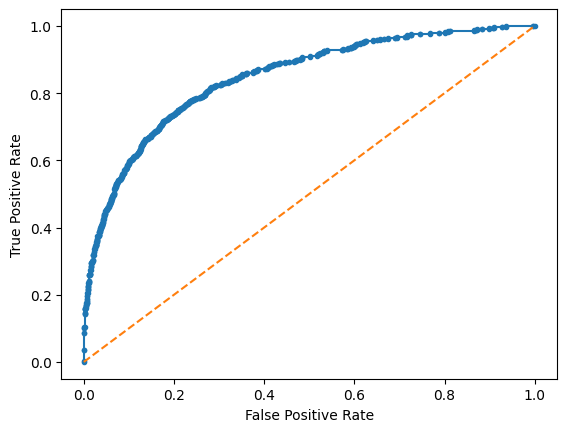

In [55]:
yprob_tomorrow = logmodel_rain_tomorrow.predict_proba(rain_tomorrow_ds_logistic.x_test)[:,1]

plot_roc_curve(rain_tomorrow_ds_logistic.y_test, yprob_tomorrow)

print(f"RainTomorrow : {roc_auc_score(rain_tomorrow_ds_logistic.y_test, y_pred_tomorrow)}")

### ROC-AUC Scores
---
<p> Vemos que tanto para RainTomorrow, el ROC Score nos da arriba de 0.75 lo que a primera vista parece ser que el modelo pareceria tener una performa aceptable.</p>
<p> Pero vamos a evaluar con precission-recall curve, si nuestro modelo realmente esta performando tan bien como pensamos ya que estamos trabajando con clases extremadamente desbalanceadas. </p>

## Precision-Recall Curve
---


In [56]:
from sklearn.metrics import precision_recall_curve

def plot_precision_recall_curve(true_y, y_prob, class_label=1, label="Logistic"):
    no_skill = len(true_y[true_y==class_label]) / len(true_y)

    plt.plot([0,1], [no_skill,no_skill], linestyle='--', label=f'No Skill - {label}')

    precision, recall, _ = precision_recall_curve(true_y, y_prob)
    plt.plot(recall, precision, marker='.', label=label)
    plt.xlabel('Recall - (True Positive Rate)')
    plt.ylabel('Precision - (Positive Predictive Value)')
    plt.legend()

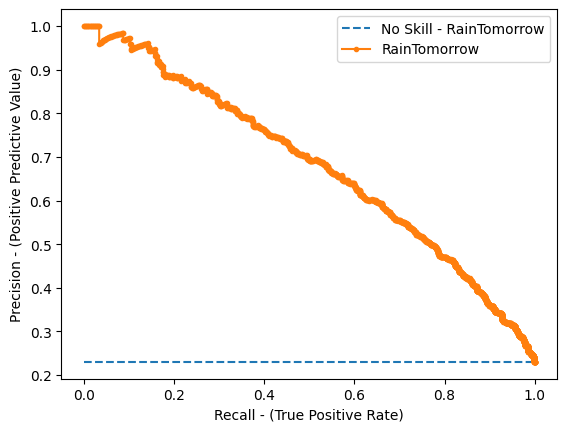

In [57]:
plot_precision_recall_curve(rain_tomorrow_ds_logistic.y_test, yprob_tomorrow, label="RainTomorrow")


### Precission-Recall Scores
---
Las predicciones del modelo sobre RainTomorrow son muy malas

## Shap 
---


In [58]:
import shap
#shap.initjs()

## Shap sobre RainfallTomorrow
---

In [59]:
rainfall_tomorrow_features = rainfall_tomorrow_ds_linear.df.columns.drop("RainfallTomorrow")
explainer_log = shap.Explainer(elastinetcv_result_rt[0], rainfall_tomorrow_ds_linear.x_train, feature_names=rainfall_tomorrow_features)
shap_log = explainer_log.shap_values(rainfall_tomorrow_ds_linear.x_test)
shap_values_log = explainer_log(rainfall_tomorrow_ds_linear.x_test)
index = 0

explanation_log = shap.Explanation(values=shap_log[index], base_values=explainer_log.expected_value, feature_names=rainfall_tomorrow_features)

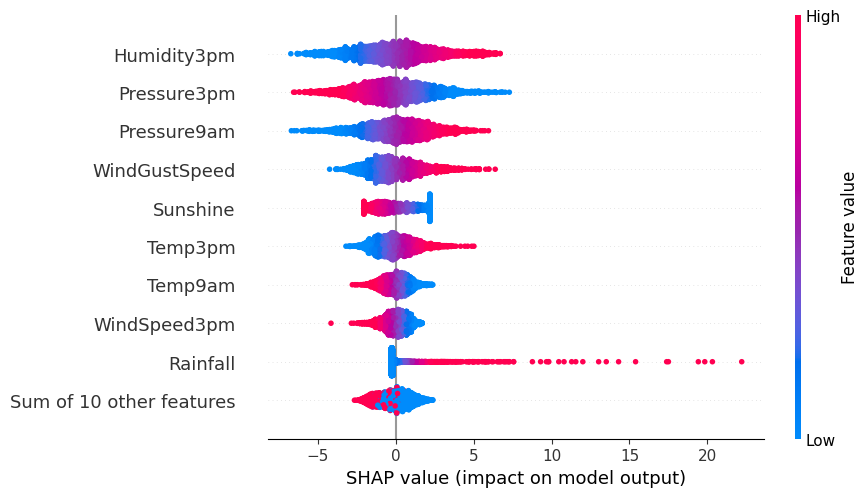

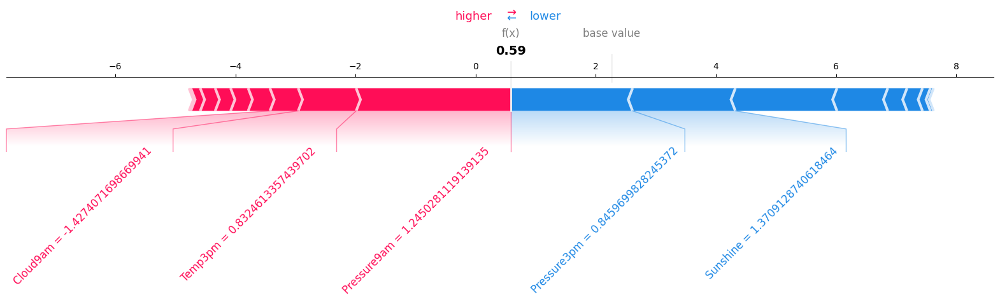

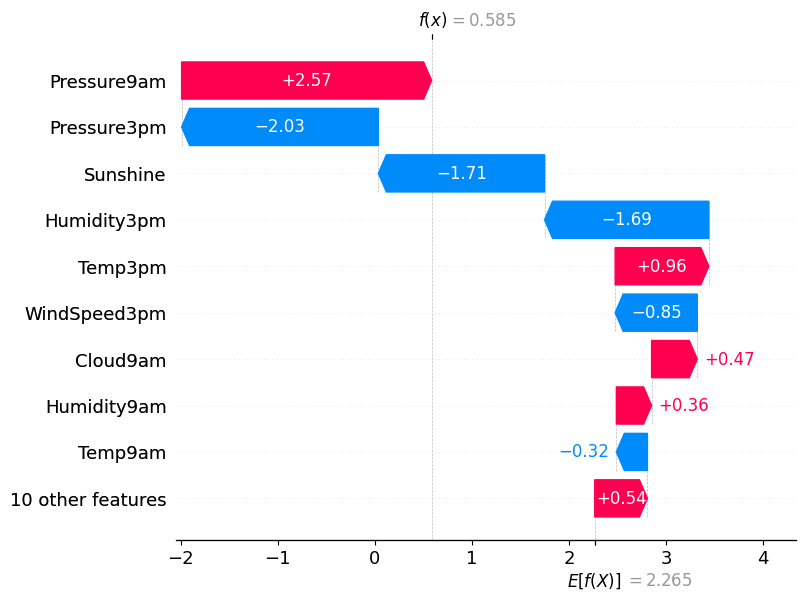

In [60]:
shap.plots.beeswarm(shap_values_log)
shap.plots.force(shap_values_log[0:100], feature_names=rainfall_tomorrow_features)
shap.force_plot(explainer_log.expected_value, explanation_log.values, rainfall_tomorrow_ds_linear.x_test[0], text_rotation=45, feature_names=rainfall_tomorrow_features, matplotlib=True)
shap.plots.waterfall(explanation_log)

### Sharp sobre RainTomorrow
---

In [61]:
rain_tomorrow_features = rain_tomorrow_ds_logistic.df.columns.drop("RainTomorrow")
explainer_log = shap.Explainer(logmodel_rain_tomorrow, rain_tomorrow_ds_logistic.x_train, feature_names=rain_tomorrow_features)
shap_log = explainer_log.shap_values(rain_tomorrow_ds_logistic.x_test)
shap_values_log = explainer_log(rain_tomorrow_ds_logistic.x_test)
index = 0
explanation_log = shap.Explanation(values=shap_log[index], base_values=explainer_log.expected_value, feature_names=rain_tomorrow_features)

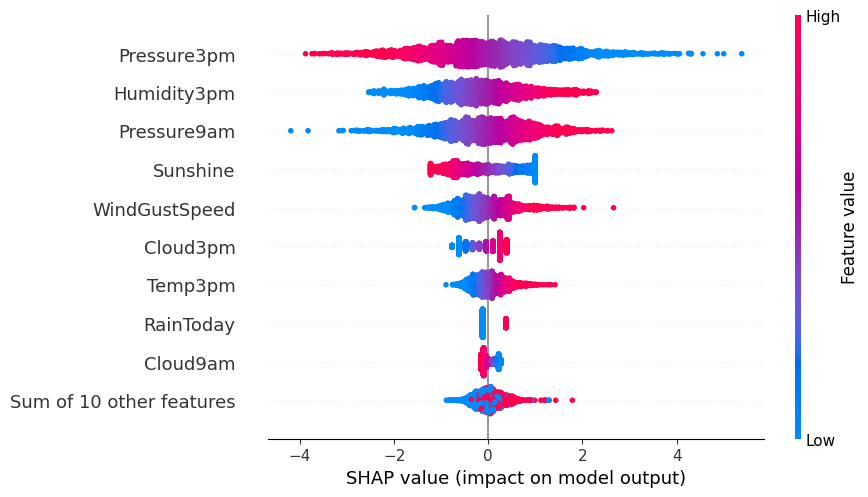

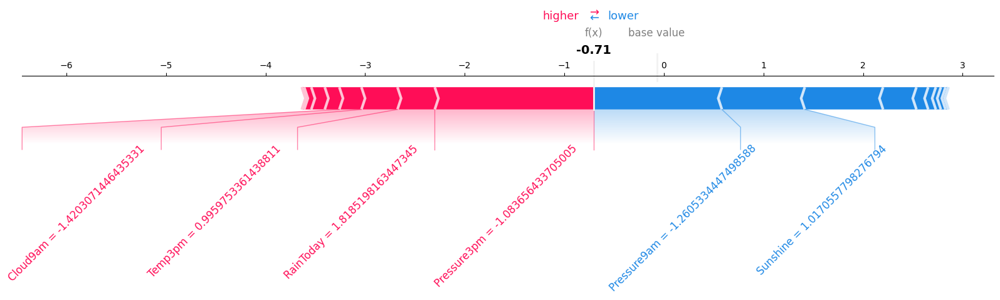

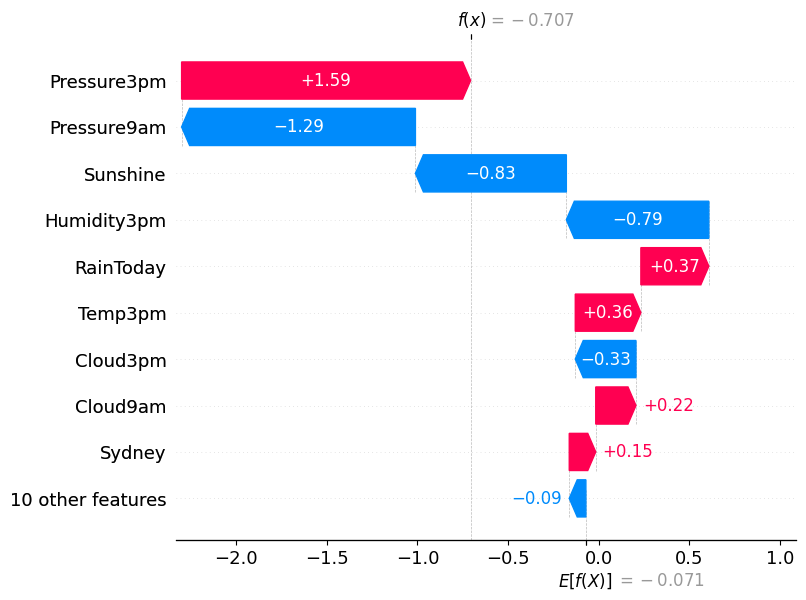

In [62]:
shap.plots.beeswarm(shap_values_log)
shap.plots.force(shap_values_log[0:100], feature_names=rain_tomorrow_features)
shap.force_plot(explainer_log.expected_value, explanation_log.values, rain_tomorrow_ds_logistic.x_test[0], text_rotation=45, feature_names=rain_tomorrow_features, matplotlib=True)
shap.plots.waterfall(explanation_log)

## Conclusion Shap sobre regresion logistica
Vemos que en cuestiones generales, las variables que más afectan la predicción del modelo son:
* Pressure3pm
* Humidity3pm
* Pressure9am

# Redes neuronales
---

In [63]:
import optuna
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Input
from sklearn.metrics import roc_auc_score

tf.config.run_functions_eagerly(True)
tf.data.experimental.enable_debug_mode()

def target_class(trial: optuna.trial.Trial , x_train, y_train, x_test, y_test, batch_size=50, epochs=10):
    num_capas = trial.suggest_int("num_layers", 1, 4)
    model = Sequential()
    for i in range(num_capas):
        num_conexiones = trial.suggest_int(f"n_units_layer_{i}", 4, 200)
        model.add(Dense(num_conexiones, activation="relu"))
    
    model.add(Dense(1, activation="sigmoid"))
    model.compile(optimizer="adam", loss="binary_crossentropy", metrics=[tf.keras.metrics.AUC(curve="ROC")])
    model.fit(x_train, y_train, validation_data=(x_test, y_test), epochs=epochs, batch_size=batch_size)
    
    scores = model.evaluate(x_test, y_test, verbose=0)
    return scores

2024-02-18 23:06:29.726338: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-02-18 23:06:29.726363: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-02-18 23:06:29.727011: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-02-18 23:06:29.731031: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-02-18 23:06:30.412607: W tensorflow/compiler/tf2

### Optuna
---
Se define una función objetivo para poder encontrar los mejores hiperparámetros para el modelo. Luego, se utiliza *optuna* para maximizar la función

In [64]:
study = optuna.create_study(directions=["minimize", "maximize"])
study.optimize( 
    lambda trial: target_class(
        trial, 
        x_train=rain_tomorrow_ds_logistic.x_train, 
        y_train=rain_tomorrow_ds_logistic.y_train, 
        x_test=rain_tomorrow_ds_logistic.x_test, 
        y_test=rain_tomorrow_ds_logistic.y_test
    ), 
    n_trials=1
)

[I 2024-02-18 23:06:30,750] A new study created in memory with name: no-name-37896633-7bd6-483f-9075-04a644b26250
2024-02-18 23:06:30.785336: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-02-18 23:06:30.786176: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-02-18 23:06:30.786279: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUM

Epoch 1/10


2024-02-18 23:06:31.055228: I external/local_tsl/tsl/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory


362/362 [==============================] - 9s 21ms/step - loss: 0.5780 - auc: 0.7646 - val_loss: 0.5155 - val_auc: 0.8349
Epoch 2/10
362/362 [==============================] - 7s 20ms/step - loss: 0.4731 - auc: 0.8549 - val_loss: 0.4815 - val_auc: 0.8462
Epoch 3/10
362/362 [==============================] - 7s 20ms/step - loss: 0.4599 - auc: 0.8639 - val_loss: 0.4759 - val_auc: 0.8502
Epoch 4/10
362/362 [==============================] - 7s 21ms/step - loss: 0.4523 - auc: 0.8688 - val_loss: 0.4809 - val_auc: 0.8527
Epoch 5/10
362/362 [==============================] - 7s 20ms/step - loss: 0.4463 - auc: 0.8725 - val_loss: 0.4674 - val_auc: 0.8559
Epoch 6/10
362/362 [==============================] - 7s 20ms/step - loss: 0.4414 - auc: 0.8756 - val_loss: 0.4706 - val_auc: 0.8574
Epoch 7/10
362/362 [==============================] - 7s 20ms/step - loss: 0.4378 - auc: 0.8778 - val_loss: 0.4556 - val_auc: 0.8583
Epoch 8/10
362/362 [==============================] - 7s 20ms/step - loss: 0.434

[I 2024-02-18 23:07:47,286] Trial 0 finished with values: [0.4576376974582672, 0.8608096837997437] and parameters: {'num_layers': 1, 'n_units_layer_0': 11}. 


In [65]:
print( study.best_trials[0].params )
print( study.best_trials[0].values )

{'num_layers': 1, 'n_units_layer_0': 11}
[0.4576376974582672, 0.8608096837997437]


Los mejores parámetros para nuestro modelo:
* num_layers: 3
* Neuronas en capa 1: 24, 148, 29, 152

<p> <b>Loss</b>: 0.47 <b>ROC Score</b>: 0.86 </p>

### Conclusion Optuna
---
<p> Vemos que si bien tenemos un score para el ROC aceptable, la funcion de perdida muestra que a nuestro modelo le va a costar predecir valores reales para saber si va a llover. </p>

# Creacion del modelo Logistico
---


In [66]:
model_reg = Sequential()
model_reg.add(Input(shape=[len(rain_tomorrow_features), ]))
model_reg.add(Dense(24, activation="relu"))
model_reg.add(Dense(148, activation="relu"))
model_reg.add(Dense(29, activation="relu"))
model_reg.add(Dense(152, activation="relu"))
model_reg.add(Dense(1, activation="sigmoid"))
model_reg.compile(optimizer="adam", loss="binary_crossentropy", metrics=[tf.keras.metrics.AUC(curve="ROC")])
history_reg = model_reg.fit(rain_tomorrow_ds_logistic.x_train, rain_tomorrow_ds_logistic.y_train, validation_data=(rain_tomorrow_ds_logistic.x_test, rain_tomorrow_ds_logistic.y_test), epochs=10)

Epoch 1/10
565/565 [==============================] - 18s 32ms/step - loss: 0.4710 - auc_1: 0.8566 - val_loss: 0.4555 - val_auc_1: 0.8524
Epoch 2/10
565/565 [==============================] - 18s 32ms/step - loss: 0.4287 - auc_1: 0.8830 - val_loss: 0.4834 - val_auc_1: 0.8565
Epoch 3/10
565/565 [==============================] - 18s 31ms/step - loss: 0.4102 - auc_1: 0.8935 - val_loss: 0.5392 - val_auc_1: 0.8573
Epoch 4/10
565/565 [==============================] - 18s 31ms/step - loss: 0.3954 - auc_1: 0.9010 - val_loss: 0.4592 - val_auc_1: 0.8504
Epoch 5/10
565/565 [==============================] - 18s 31ms/step - loss: 0.3789 - auc_1: 0.9091 - val_loss: 0.4245 - val_auc_1: 0.8492
Epoch 6/10
565/565 [==============================] - 18s 31ms/step - loss: 0.3674 - auc_1: 0.9147 - val_loss: 0.4827 - val_auc_1: 0.8456
Epoch 7/10
565/565 [==============================] - 18s 31ms/step - loss: 0.3547 - auc_1: 0.9201 - val_loss: 0.4589 - val_auc_1: 0.8502
Epoch 8/10
565/565 [==============

92/92 [==============================] - 1s 10ms/step - loss: 0.5020 - auc_1: 0.8489


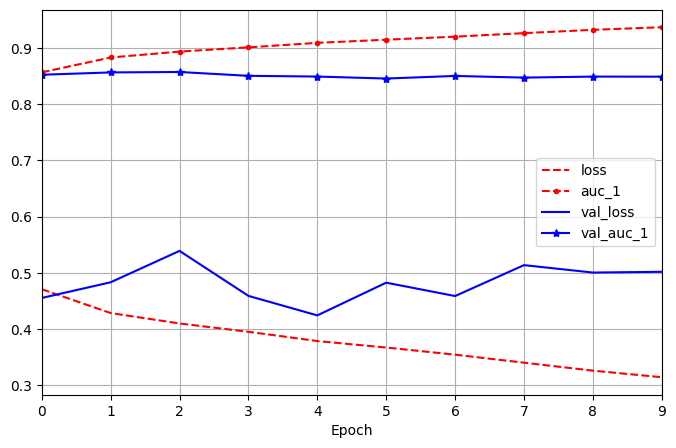

In [67]:
model_reg.evaluate(rain_tomorrow_ds_logistic.x_test, rain_tomorrow_ds_logistic.y_test)
pd.DataFrame(history_reg.history).plot(figsize=(8, 5), xlim=[0, 9],  grid=True, xlabel="Epoch", style=["r--", "r--.", "b-", "b-*"])
plt.show()

## Conclusion Modelo Logistico
---

<p> Si bien el ROC Score nos muestra un resultado mas que aceptable, la funcion de perdida por otro lado muestra que las predicciones de si llueve o no resultan ser imprecisas. </p>
<p> Podemos ver tambien, que la funcion de perdida del entrenamiento se ajusta mucho mejor a los datos de training que a los de test, por lo que podemos decir que los datos que tenemos para nuestro modelos no son suficientes y estariamos ante un escenario de overfetting </p>

# Creacion del modelo lineal
---

In [68]:
def plot_history(history):
  hist = pd.DataFrame(history.history)
  hist['epoch'] = history.epoch

  plt.figure()
  plt.xlabel('Epoch')
  plt.ylabel('Mean Abs Error [MPG]')
  plt.plot(hist['epoch'], hist['mae'],
           label='Train Error')
  plt.plot(hist['epoch'], hist['val_mae'],
           label = 'Val Error')
  plt.legend()

  plt.figure()
  plt.xlabel('Epoch')
  plt.ylabel('Mean Square Error [$MPG^2$]')
  plt.plot(hist['epoch'], hist['mse'],
           label='Train Error')
  plt.plot(hist['epoch'], hist['val_mse'],
           label = 'Val Error')
  plt.legend()
  plt.show()

In [69]:
def target_class_lineal(trial: optuna.trial.Trial , x_train, y_train, x_test, y_test, batch_size=50, epochs=10):
    num_capas = trial.suggest_int("num_layers", 1, 4)
    model = Sequential()
    for i in range(num_capas):
        num_conexiones = trial.suggest_int(f"n_units_layer_{i}", 4, 200)
        model.add(Dense(num_conexiones, activation="relu"))
    
    model.add(Dense(1))
    model.compile(optimizer="adam", loss = 'mean_absolute_error', metrics=["mae", "mse"])
    model.fit(x_train, y_train, validation_data=(x_test, y_test), epochs=epochs, batch_size=batch_size)
    
    scores = model.evaluate(x_test, y_test, verbose=0)
    return scores

In [70]:
study_linear = optuna.create_study(directions=["minimize", "minimize", "minimize"])
study_linear.optimize( 
    lambda trial: target_class_lineal(
        trial, 
        x_train=rainfall_tomorrow_ds_linear.x_train, 
        y_train=rainfall_tomorrow_ds_linear.y_train, 
        x_test=rainfall_tomorrow_ds_linear.x_test, 
        y_test=rainfall_tomorrow_ds_linear.y_test
    ), 
    n_trials=1
)

[I 2024-02-18 23:10:47,631] A new study created in memory with name: no-name-23796ae7-5a1d-4a4a-b729-b0b1faa09c75


Epoch 1/10
235/235 [==============================] - 6s 26ms/step - loss: 2.0793 - mae: 2.0793 - mse: 50.1642 - val_loss: 2.1415 - val_mae: 2.1415 - val_mse: 48.6491
Epoch 2/10
235/235 [==============================] - 6s 26ms/step - loss: 1.9292 - mae: 1.9292 - mse: 42.8750 - val_loss: 2.0911 - val_mae: 2.0911 - val_mse: 46.4343
Epoch 3/10
235/235 [==============================] - 6s 26ms/step - loss: 1.8929 - mae: 1.8929 - mse: 40.5893 - val_loss: 2.0592 - val_mae: 2.0592 - val_mse: 46.9554
Epoch 4/10
235/235 [==============================] - 6s 25ms/step - loss: 1.8726 - mae: 1.8726 - mse: 39.5409 - val_loss: 2.0701 - val_mae: 2.0701 - val_mse: 48.6035
Epoch 5/10
235/235 [==============================] - 6s 26ms/step - loss: 1.8602 - mae: 1.8602 - mse: 39.5372 - val_loss: 2.0576 - val_mae: 2.0576 - val_mse: 46.8904
Epoch 6/10
235/235 [==============================] - 6s 25ms/step - loss: 1.8446 - mae: 1.8446 - mse: 38.4262 - val_loss: 2.0622 - val_mae: 2.0622 - val_mse: 42.502

[I 2024-02-18 23:11:48,251] Trial 0 finished with values: [2.005385637283325, 2.005385637283325, 43.51674270629883] and parameters: {'num_layers': 3, 'n_units_layer_0': 24, 'n_units_layer_1': 106, 'n_units_layer_2': 12}. 


In [71]:
print( study_linear.best_trials[0].params )
print( study_linear.best_trials[0].values )

{'num_layers': 3, 'n_units_layer_0': 24, 'n_units_layer_1': 106, 'n_units_layer_2': 12}
[2.005385637283325, 2.005385637283325, 43.51674270629883]


Los mejores parámetros para nuestro modelo:
* num_layers: 3
* Neuronas en capa 1: 105, 138, 29

<p> <b>Loss MAE</b>: 2.22 <b>MSE</b>: 50.8 </p>

In [72]:
model_linear = Sequential()

rainfall_feature=rainfall_tomorrow_ds_linear.df.columns.drop("Rainfall")

model_linear.add(Input(shape=[len(rainfall_feature), ]))
model_linear.add(Dense(105, activation="relu"))
model_linear.add(Dense(138, activation="relu"))
model_linear.add(Dense(29, activation="relu"))
model_linear.add(Dense(1))
model_linear.compile(optimizer="adam", loss="mean_absolute_error", metrics=['mae', 'mse'])
history_linear = model_linear.fit(rainfall_tomorrow_ds_linear.x_train, rainfall_tomorrow_ds_linear.y_train, validation_data=(rainfall_tomorrow_ds_linear.x_test, rainfall_tomorrow_ds_linear.y_test), epochs=10)

Epoch 1/10
367/367 [==============================] - 9s 25ms/step - loss: 1.9952 - mae: 1.9952 - mse: 45.6633 - val_loss: 2.0850 - val_mae: 2.0850 - val_mse: 48.6553
Epoch 2/10
367/367 [==============================] - 9s 25ms/step - loss: 1.8991 - mae: 1.8991 - mse: 40.6117 - val_loss: 2.0366 - val_mae: 2.0366 - val_mse: 45.5198
Epoch 3/10
367/367 [==============================] - 9s 25ms/step - loss: 1.8658 - mae: 1.8658 - mse: 39.3857 - val_loss: 2.0242 - val_mae: 2.0242 - val_mse: 42.8903
Epoch 4/10
367/367 [==============================] - 9s 25ms/step - loss: 1.8417 - mae: 1.8417 - mse: 37.8224 - val_loss: 2.0144 - val_mae: 2.0144 - val_mse: 42.8155
Epoch 5/10
367/367 [==============================] - 9s 25ms/step - loss: 1.8365 - mae: 1.8365 - mse: 37.7086 - val_loss: 2.0022 - val_mae: 2.0022 - val_mse: 44.1570
Epoch 6/10
367/367 [==============================] - 9s 25ms/step - loss: 1.7983 - mae: 1.7983 - mse: 36.4441 - val_loss: 1.9876 - val_mae: 1.9876 - val_mse: 42.127

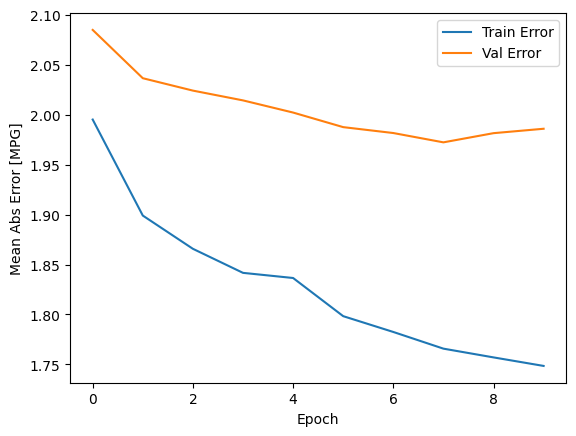

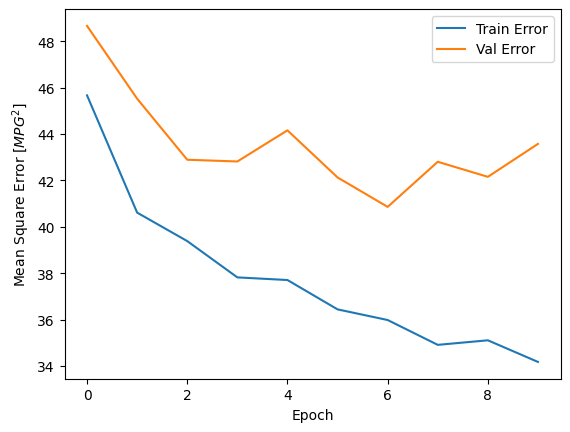

In [73]:
plot_history(history_linear)

### Conclusion del Modelo Linear
---

<p> Teniendo en cuenta que la variable Rainfall cuenta con gran cantidad de outliers y valores entre 0 y 120, parece ser que el modelo es bastante prometedor para predecir la cantidad de lluvia con un <b>MAE < 2.25</b> y <b>MSE < 50<b>. </p>


# Exportacion del modelo
---

In [74]:
import joblib
from sklearn.pipeline import Pipeline

pipeline_clas ={
    "columns": rain_tomorrow_ds_logistic.df.columns.drop("RainTomorrow"),
    "pipeline": Pipeline([
        ("preprocessor", rain_tomorrow_ds_logistic.scaler),
        ('logistic_regression',model_reg)
    ])
} 

pipeline_reg ={
    "columns": rainfall_tomorrow_ds_linear.df.columns.drop("RainfallTomorrow"),
    "pipeline": Pipeline([
        ("preprocessor", rainfall_tomorrow_ds_linear.scaler),
        ('linear_regression',model_linear)
    ])
}

joblib.dump(pipeline_clas, 'models/clas.pkl')
joblib.dump(pipeline_reg, 'models/reg.pkl')

print("Models experted !")

Models experted !


# Conclusión Final
---

Durante este proyecto, exploramos y desarrollamos múltiples modelos para predecir la lluvia basándonos en diversas características. Comenzamos abordando la integridad de nuestros datos al completar los valores faltantes, asegurándonos de mantener la calidad de nuestro conjunto de datos para su análisis.

Para nuestros modelos de regresión lineal, experimentamos con varios enfoques, incluyendo Ridge, Lasso y Elastic Net. Observamos cómo cada uno maneja la regularización y la complejidad del modelo, lo que nos permitió seleccionar el enfoque más adecuado para nuestro problema. Sin embargo, nunca logramos obtener un buen modelo de regresión lineal.

En el desarrollo para implementar las regresiones logisticas, tuvimos que lidiar con el desbalance en los datos para las clases de RainTomorrow, por lo que aplicamos técnicas de balanceo en nuestro conjunto de datos aplicando SMOTE, lo que mejoró significativamente el rendimiento y la generalización de nuestros modelos.

Exploramos modelos más avanzados, incluyendo redes neuronales tanto para regresión como para clasificación, utilizando TensorFlow y Keras. Estos modelos demostraron una gran capacidad para capturar relaciones no lineales y patrones complejos en los datos, aunque requirieron una mayor complejidad de ajuste pero se pudo lograr un modelo de prediccion mas aceptable que los planteados en la primera fase del trabajo practico.

Analizamos los modelos con Shap para generar gráficos explicativos de como las diferente features actuan sobre nuestras variables objetivos.

Finalmente, integramos todos nuestros modelos en una pipeline para una implementación más sencilla y usamos Streamlit para llevar nuestro proyecto a producción. Esta herramienta nos permitió crear una interfaz interactiva y amigable que ofrece nuestras predicciones a los usuarios finales.